# Training a Deep Neural Network with the minimax scores on a Connect 4 Game

In [2]:
import connect_4_utils as c4
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# from random import choice
from numpy.random import Generator, PCG64
#from matplotlib.colors import ListedColormap
#from PIL import Image
# import imageio.v2 as imageio
import cv2
import os
#import torch
from numba import vectorize, jit, njit, int32, cuda
# from numba.cuda.random import create_xoroshiro128p_states, xoroshiro128p_uniform_float32
from matplotlib.colors import ListedColormap
# import multiprocessing
# import threading
import time
from datetime import datetime

print('Import successful')

Import successful


### Python file connect_4_utils.py imported as c4 has these functions:  
create_board(board_size=(6,7))  
list_legal_moves(board)  
make_move(board, column, player, comments=False)  
remove_move(board, column)  
spots_left(board)  
get_sections(board)  
fill_board_test(board=create_board(), player=1, moves=42)  
section_score(section, player)  
evaluation(board, player)  
miniMax(board, depth=3, player=2, isMax=False, alpha=-np.inf, beta=np.inf)  
best_move(board, player)

## Creating datasets for my DNN
Creating multiple Datasets each one consisting of n board states in the form of column entries Cell_0 to Cell_41 from top-left corner to bottom-right corner.  
Aswell as the minimax score for each possible move.  
At every board state it assumes you have to pick the next move to play.  
  
![example board and cell enummeration](visuals/empty_board_with_numbers.png "Board with enummerated Cells")

In [3]:
# Created 30.07.
# Function to make a random possible move on the board
@njit
def random_move(board, player):
    board, move = c4.make_move(board, np.random.choice(np.array(c4.list_legal_moves(board))), player)
    return board, move

In [4]:
# Created 30.07.
# Function to make a move based on the miniMax function with depth x
@njit
def miniMax_move(board, player, depth):
    board_copy = np.copy(board)
    _, best_move_column = c4.miniMax(board=board_copy, depth=depth, player=player, 
                                     isMax=True, alpha=-np.inf, beta=np.inf)
    board, last_move = c4.make_move(board, best_move_column, player)
    print(best_move_column, last_move, c4.list_legal_moves(board))
    return board, last_move

In [5]:
# Created 2.8.
# Populate a board with a X random moves
@njit
def board_rnd_seed(board, player=1, x_moves=10):
    for i in range(x_moves):
        random_move(board, player)
        player = 0 - player
        if c4.check_winner(board) != 0:
            break
    return board, i

In [6]:
# Created 2.08.
# Visualizing a board
# Not @njit compatible since it uses plt
def visualize_board(board, last_move=(-1,-1), numbers=False, name='', with_visuals=False):
    game_state = board
#     game_state = np.rot90(board, k=1)
#     game_state = np.flip(board, axis=0)
    
    # Define the colors for visualization
    colors = ['white', 'red', 'yellow']
    last_move_color = ['white','darkred', '#bbc43c']

    # Create a figure and axis
    fig, ax = plt.subplots(facecolor='#4d87dd')
    
    
#     fig = plt.figure(frameon=False)

    # Plot the game board with circles
    rows, cols = game_state.shape[0], game_state.shape[1]
    cell_numbers = 0
    for row in range(rows):
        for col in range(cols):
            color = game_state[row, col]
            this_col, this_row = (cols-1) - abs(col - (cols - 1)), (rows-1) - row
            
            if row == last_move[0] and col == last_move[1]:
                circle = plt.Circle((this_col, this_row), radius=0.4, color=last_move_color[color])
            else:
                circle = plt.Circle((this_col, this_row), radius=0.4, color=colors[color])
            ax.add_patch(circle)
            if numbers == True:
                ax.text(this_col, this_row, cell_numbers, fontsize=12, ha='center', va='center')
            cell_numbers += 1

    # Set the aspect ratio and axis limits
    ax.set_aspect('equal')
    ax.set_xlim(-0.5, 6.5)
    ax.set_ylim(-0.5, 5.5)

    # Customize the ticks and gridlines
    ax.set_xticks(np.arange(0, 7, 1))
    ax.set_yticks(np.arange(0, 6, 1))
    ax.grid(color='none', linestyle='-', linewidth=2)

    # Remove the axis labels
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_facecolor('#4d87dd')
    
    # Show the plot
    if name != '':
        plt.savefig(name, bbox_inches='tight')
        
    if with_visuals == True:
        plt.show()
    else:
        plt.close()
    
# board, _ = board_rnd_seed(c4.create_board())
# print(board)
# visualize_board(c4.create_board(), name='foo', with_visuals=True)

In [7]:
# Created 7.8.
# Buffer for creating datasets to prevent: [Errno 13] Permission denied: 'dataset_1.csv'
def buffer_board(old_buffer, board, board_scores):
    # Creating the new buffer with old one and one more row for a new board
    board = board.flatten()
    prepped_score = np.empty(len(board_scores))
    for score, i in zip(board_scores, range(len(board_scores))):
        if score == 0 and board[i] != 0:
            # instead of using 0 to indicated a full column i use a big negative value for the DNN model
            prepped_score[i] = -4000 #-9999
        else:
            prepped_score[i] = score
        
    board_prepped = np.append(board, prepped_score)
    
    if len(old_buffer) < 1:
        new_buffer = [np.array(board_prepped)]
    else:
        new_buffer = np.concatenate((old_buffer, [board_prepped]), axis=0)
    
    return new_buffer

In [8]:
# Created 7.8.
# Writing a buffer consisting of multiple rows of board + the column scores
def buffer_to_csv(buffer, dataset_name):
    buffer = np.array(buffer)
    for i in range(buffer.shape[0]):
        with open(dataset_name, "at") as file:
            np.savetxt(file, [buffer[i,:]], delimiter=';', fmt="%s")

In [9]:
# Created 8.8.
def swap_player_numbers(board_original):
    board = np.copy(board_original)
    swapped_board = np.where(board == 1, -1, np.where(board == -1, 1, board))
    return swapped_board

In [10]:
def save_as_mp4():
    # Directory containing your PNG images
    image_dir = "visuals/"

    # Get a list of all PNG files in the directory
    image_files = [f for f in os.listdir(image_dir) if f.endswith(".png")]

    # Sort the image files by name (assuming they are named in order)
#     image_files.sort()
    
    print(image_files)

    # Load the first image to get dimensions
    first_image = cv2.imread(os.path.join(image_dir, image_files[0]))
    height, width, layers = first_image.shape

    # Create a VideoWriter object to save the video
    output_video = "connect_4_game.mp4"
    fourcc = cv2.VideoWriter_fourcc(*"mp4v")  # Specify the codec
    out = cv2.VideoWriter(output_video, fourcc, 5, (width, height))  # Adjust frame rate as needed

    # Loop through each image and add it to the video
    for image_file in image_files:
        image_path = os.path.join(image_dir, image_file)
        frame = cv2.imread(image_path)
        out.write(frame)

    # Release the VideoWriter and close the video file
    out.release()

In [11]:
# Created  23.07.
# Finished ##.##.
# 3.8. Return the score of every possible move not only the best one
# The board will be scored for the player whos turn it is since scoring a board which the other party plays is useless
@njit
def calc_score(board_original, player=0, depth=6):
    score = np.zeros(board_original.shape[1])

    if player == 0:
        player = 1 if c4.spots_left(board_original) % 2 == 0 else -1
    
    for column in c4.list_legal_moves(board_original):
        board = np.copy(board_original) #only work on copy to ensure the board doesnt get changed
        
        c4.make_move(board, column, player)
        move_score, _ = c4.miniMax(board, depth, player, False, -np.inf, np.inf)
        
        score[column] = move_score
    return score

In [12]:
# Created  24.07.
# Big modify? 1.9.
# Creating a dataset with all strategies as input
# Missing: Try using the gpu to speed up computing times (currently @njit to convert to machine code)
def create_dataset(batch_size=100, moves_max=42 , strategy=0, board_size=(6,7), seed_moves=0, with_visuals=False):
    # Enumerate all cells from top left to bottom right from cell_0 to cell_41
    cell_names = np.array(['cell_' + str(i) for i in range(board_size[0]*board_size[1])])
    score_names = np.array(['column_'+str(i)+'_score' for i in range(board_size[1])])
    header = np.append(cell_names, score_names)
    # Saving array as the dataset head with a score column
    date = datetime.today().strftime('%d_%m')
    folder_name = str('./'+date+'_dataset_'+str(strategy)+'_seeded_'+str(seed_moves))
    os.makedirs(folder_name+'/visuals', exist_ok=True)
    dataset_name = date+'_dataset_'+str(strategy)+'_seeded_'+str(seed_moves)+'.csv'
    np.savetxt(folder_name+'/'+dataset_name, [header], delimiter=';', fmt="%s")
    
    print("Creating board states with scores:")
    dataset_game_length = np.zeros((board_size[0]*board_size[1]), dtype=int)
    dataset_distribution = np.zeros((3), dtype=int)
    
    if seed_moves + moves_max > board_size[0] * board_size[1]:
        print("too many moves for board_size given; Moves given {}/{}".format(seed_moves + moves_max, board_size[0] * board_size[1]))
        return 0
    
    mm_depth = 1
    moves_max += seed_moves
    
    if strategy == 0:
        # Random vs Random
        seed_moves = moves_max
    if strategy == 1:
        # MiniMax 6 vs MiniMax 6; seeded starting board
        mm_depth = 6
    if strategy == 2:
        # MiniMax 4 vs MiniMax 4; seeded starting board
        mm_depth = 4
    if strategy == 3:
        # MiniMax 5 vs MiniMax 5; seeded starting board
        mm_depth = 5
        
    
    for batch in range(batch_size):
        image_files = []
        board = c4.create_board()
        player = 1
        buffer = []
        outcome = 0
        game_length = 0
        

        # Boards are played between Players 1 and -1, saved after every move
        # Transformed every second play to only have boards from player 1 perspective
        # First # of moves are made random if they are to be seed_moves
        for move in range(moves_max):
            if player == 1:
                board_scores = calc_score(board, player, 5)
                buffer = buffer_board(buffer, board, board_scores)
            else: #player == -1:
                tmp_board = board * (-1)
                board_scores = calc_score(tmp_board, 0 - player, 5)
                buffer = buffer_board(buffer, tmp_board, board_scores)
                
            if move <= seed_moves:
                board, last_move = random_move(board, player)
            else:
                best_move_score, best_move_column = c4.miniMax(board, mm_depth, player, True)
                board, last_move = c4.make_move(board, best_move_column, player)
#                 board, last_move = c4.make_move(board, np.argmax(board_scores), player)
               
            game_length += 1
            # Visuals
            if batch < 32:
                img_name = folder_name+'/visuals/board_state_'+str(batch)+'_'+(str(move) if move >= 10 else '0'+str(move))+'.png'
                visualize_board(board, last_move, False, img_name, with_visuals)
                image_files.append(img_name)
            outcome = c4.check_winner(board)
            if outcome != 0:
                break
            player = 0 - player
            
        dataset_game_length[game_length-1] += 1
        dataset_distribution[outcome+1] += 1 #[-1 0 1] player wins counter in these places
        buffer_to_csv(buffer, folder_name+'/'+dataset_name)
        print("Progress: {}/{}".format(batch+1, batch_size), end="\r")
        
    print("\nFinished!")
    print("Extra Info; Play Length Distribution & Outcome:")
    print(dataset_game_length[:])
    print(dataset_distribution[:])

## To Create a data set uncomment below
#### Default values:  
batch_size=100, moves_max=42 , strategy=0, board_size=(6,7), seed_moves=0, with_visuals=False
- batch_size = amount of games to be played  
- moves_max = amount of moves to be played in a game (stops on a winner and a full board)  
- strategy = 4 different strategies 
    - Random vs. Random
    - MiniMax 6 vs MiniMax 6
    - MiniMax 4 vs MiniMax 4
    - MiniMax 5 vs MiniMax 5
- board_size = tuple of rows and columns
- seed_moves = how many moves are to be played randomly in the beginning for a variety of starting board
- with_visuals = should the first 5 games be show in the Notebook

In [13]:
# start = time.perf_counter()
# create_dataset(batch_size=32, moves_max=36, strategy=1, seed_moves=6, with_visuals=False)
# end = time.perf_counter()
# timed = int(end - start)
# print("\ntime: {}m {:.2f}s".format(timed // 60, timed & 60))

In [14]:
def visualize_board_scores(board, scores, numbers=False, name='', with_visuals=True):
    game_state = board
#     game_state = np.rot90(board, k=1)
#     game_state = np.flip(board, axis=0)
    
    # Define the colors for visualization
    colors = ['white', 'red', 'yellow']
    last_move_color = ['white','darkred', '#bbc43c']

    # Create a figure and axis
    fig, ax = plt.subplots(facecolor='#4d87dd')

    # Plot the game board with circles
    rows, cols = game_state.shape[0]+1, game_state.shape[1]
    cell_numbers = 0
    for row in range(rows):
        for col in range(cols):
            if row == 0:
                this_col, this_row = (cols-1) - abs(col - (cols - 1)), (rows-1) - row
                rectang = plt.Rectangle((this_col-0.45, this_row-0.45),  width=0.9, height=0.9, color='white')
                ax.add_patch(rectang)
                ax.text(this_col, this_row, scores[col], fontsize=12, ha='center', va='center')
            else:
                color = game_state[row-1, col]
                this_col, this_row = (cols-1) - abs(col - (cols - 1)), (rows-1) - row

                circle = plt.Circle((this_col, this_row), radius=0.4, color=colors[color])
                ax.add_patch(circle)
            if numbers == True:
                ax.text(this_col, this_row, cell_numbers, fontsize=12, ha='center', va='center')
            cell_numbers += 1

    # Set the aspect ratio and axis limits
    ax.set_aspect('equal')
    ax.set_xlim(-0.5, 6.5)
    ax.set_ylim(-0.5, 6.5)

    # Customize the ticks and gridlines
    ax.set_xticks(np.arange(0, 7, 1))
    ax.set_yticks(np.arange(0, 7, 1))
    ax.grid(color='none', linestyle='-', linewidth=2)

    # Remove the axis labels
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_facecolor('#4d87dd')
    
    # Show the plot
    if name != '':
        plt.savefig(name, bbox_inches='tight')
        
    if with_visuals == True:
        plt.show()
    else:
        plt.close()
    
# board, _ = board_rnd_seed(c4.create_board())
# print(board)
# visualize_board(c4.create_board(), name='foo', with_visuals=True)

# board = [[0,0,1,1,0,0,-1],[0,0,1,-1,0,0,-1],[0,0,-1,-1,0,0,-1],[0,1,1,-1,0,0,1],[1,-1,-1,1,-1,-1,1],[-1,-1,1,1,-1,1,1]]
# scores = [-1223,-1415,-4000,-4000,-1490,-590,-4000]
# board2 = [[0,0,0,0,0,0,0],[0,0,0,0,-1,0,0],[-1,-1,0,0,1,-1,0],[1,1,0,0,1,1,0],[-1,1,0,0,-1,1,0],[-1,-1,0,1,1,-1,-1]]
# scores2 = [13,14,10,-191,22,22,11]
# board3 = [[0,0,0,0,0,0,0],[0,0,0,0,0,0,0],[0,0,0,1,0,0,0],[0,0,-1,-1,0,0,0],[1,0,-1,-1,1,0,0],[1,0,1,-1,1,0,-1]]
# scores3 = [-322,-337,-226,-298,-302,-337,-327]
# board = np.array(board)
# visualize_board_scores(board, scores, name='board_with_scores_1')
# board2 = np.array(board2)
# visualize_board_scores(board2, scores2, name='board_with_scores_2')
# board3 = np.array(board3)
# visualize_board_scores(board3, scores3, name='board_with_scores_3')

## The four datasets used in the thesis:

### 02_09_dataset_2_seeded_10.csv stats:  
Extra Info; Play Length Distribution & Outcome:  
[  0   0   0   0   0   0  16   9  25  13  29 134  20  11  10  11  9  7  16  18  14  11  12  12  17  10  18  11  13  11   7  16  15  36  39  51  27  69  96  71  22  94]  
[527  68 405]  

time: 2162.37s  

---

### 02_09_dataset_3_seeded_10.csv stats:
Extra Info; Play Length Distribution & Outcome:  
[  0   0   0   0   0   0  36  17  50  34  68 278  46  35  25  12  23  34 69  67  83  62  78  62  40  49  31  35  27  35  28  53  26  46  52  55 70  64  90  90  29 101]  
[1057   72  871]  

time: 289m 44.00s

---

### 03_09_dataset_1_seeded_10.csv stats:
Extra Info; Play Length Distribution & Outcome:  
[ 0  0  0  0  0  0  7  3  5  9 15 77  9  9  4  7  0  8  9  4  3  6  3  7 5  3  3  6  0  3  9 13  7 16 12 20 11 42 48 37 18 62]  
[286  46 168]  

time: 88m 12.00s

---

### 15_09_dataset_1_seeded_6.csv stats:
Extra Info; Play Length Distribution & Outcome:  
[  0   0   0   0   0   0  19  60  14   9   2   0   0   0   0   0   1   7 6   6   9  12  14   7  10   8   4  10   8   6  10 27  20  53  50  60 41 116 122  90  43 180]  
[525 126 373]

time: 202m 56.00s

In [15]:
# Calculating different metrics from the analysis array
def plot_graphs(analysis):
    vic1 = np.zeros((42,), dtype=int)
    for board in analysis:
        vic1[np.argmax(board)] += 1    
    vic2 = np.sum(analysis, axis=0)
    vic3 = np.sum(np.maximum(analysis, 0), axis=0)
    vic4 = np.sum(np.minimum(analysis, 0), axis=0)
    vic5 = np.mean(analysis, axis=0)
    vic6 = np.mean(np.maximum(analysis, 0), axis=0)
    vic7 = np.mean(np.minimum(analysis, 0), axis=0)
    # Normalizing for better visuals
    vic1 = 2 * (vic1 - vic1.min()) / (vic1.max() - vic1.min()) - 1
    vic2 = 2 * (vic2 - vic2.min()) / (vic2.max() - vic2.min()) - 1
    vic3 = 2 * (vic3 - vic3.min()) / (vic3.max() - vic3.min()) - 1
    vic4 = 2 * (vic4 - vic4.min()) / (vic4.max() - vic4.min()) - 1
    vic5 = 2 * (vic5 - vic5.min()) / (vic5.max() - vic5.min()) - 1
    vic6 = 2 * (vic6 - vic6.min()) / (vic6.max() - vic6.min()) - 1
    vic7 = 2 * (vic7 - vic7.min()) / (vic7.max() - vic7.min()) - 1

    # print(vic, vic.shape)
    # print(vic3, vic3.shape)
    plt.plot(np.array(range(0, 42)), vic1, color = "red", marker = "o", label = "argmax")
    plt.plot(np.array(range(0, 42)), vic2, color = "orange", marker = "o", label = "sum all")
    plt.plot(np.array(range(0, 42)), vic3, color = "yellow", marker = "o", label = "sum positives")
    plt.plot(np.array(range(0, 42)), vic4, color = "green", marker = "o", label = "sum negatives")
    plt.plot(np.array(range(0, 42)), vic5, color = "blue", marker = "o", label = "mean all")
    plt.plot(np.array(range(0, 42)), vic6, color = "purple", marker = "o", label = "mean positives")
    plt.plot(np.array(range(0, 42)), vic7, color = "pink", marker = "o", label = "mean negatives")
    plt.legend()
    plt.show()
    
    return vic1, vic2, vic3, vic4, vic5, vic6, vic7

In [16]:
def visualize_cell_importance(vic_board, board_shape=(6,7), numbers=True, title='', name=''):
#     game_state = np.rot90(board, k=1)
#     game_state = np.flip(board, axis=0)
    
    # Define the colors for visualization
    colors = ['pink', 'red', 'darkred']
    cmap = plt.get_cmap('RdBu') #RdYlGn
    
    # Normalizing the vic values
    norm = plt.Normalize(vic_board.min(), vic_board.max())

    # Create a figure and axis
    fig, ax = plt.subplots(facecolor='#4d87dd')

    # Plot the game board with circles
    rows, cols = board_shape[0], board_shape[1]
    cell_number = 0
    
    for row in range(rows):
        for col in range(cols):
            if vic_board[cell_number] == np.max(vic_board):
                color = 2
            elif vic_board[cell_number] == np.min(vic_board):
                color = 0
            else:
                color = 1
                
            this_col, this_row = (cols-1) - abs(col - (cols - 1)), (rows-1) - row
                
            circle = plt.Circle((this_col, this_row), radius=0.4, lw=0.7, color=cmap(norm(vic_board[cell_number])))
            
            ax.add_patch(circle)
            if numbers == True:
                ax.text(this_col, this_row, cell_number, fontsize=12, ha='center', va='center')
            cell_number += 1

    # Set the aspect ratio and axis limits
    ax.set_xlim(-1, len(vic_board)) #!
    ax.set_aspect('equal')
    ax.set_xlim(-0.5, 6.5)
    ax.set_ylim(-0.5, 5.5)

    # Customize the ticks and gridlines
    ax.set_xticks(np.arange(0, 7, 1))
    ax.set_yticks(np.arange(0, 6, 1))
    ax.grid(color='none', linestyle='-', linewidth=2)

    # Remove the axis labels
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_facecolor('#4d87dd')
    
    # Add a colorbar to the plot
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label('Value')
    
    ax.set_title(title)
    
    plt.savefig('./visuals/'+datetime.today().strftime('%d_%m_')+'vic_visualizations_'+str(name), bbox_inches='tight')
    
    # Show the plot
    plt.show()

### Setting the file_name to the dataset name that should be used

In [17]:
file_name = "15_09_dataset_1_seeded_6"
date = datetime.today().strftime('%d_%m')

# Using Captum (XAI-Method) on PyTorch Model
## PyTorch

In [18]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, MinMaxScaler
from torch.utils.data import DataLoader, TensorDataset
from captum.attr import IntegratedGradients, InputXGradient, GuidedBackprop, GradientShap, LRP

import pandas as pd
import numpy as np
# import gymnasium as gym
# import math
# import random
import matplotlib
import matplotlib.pyplot as plt
# from collections import namedtuple, deque
# from itertools import count
import torch.nn.functional as F

print('Import successful')

Import successful


In [19]:
# Check if CUDA (GPU) is available, else fall back to CPU
print(f"Is CUDA supported by this system? {torch.cuda.is_available()}")
print(f"CUDA version: {torch.version.cuda}")
print(f"Pytorch version: {torch.__version__}")
 
# Storing ID of current CUDA device
cuda_id = torch.cuda.current_device()
print(f"ID of current CUDA device: {torch.cuda.current_device()}")
       
print(f"Name of current CUDA device: {torch.cuda.get_device_name(cuda_id)}")
      
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Is CUDA supported by this system? True
CUDA version: 11.8
Pytorch version: 2.0.1
ID of current CUDA device: 0
Name of current CUDA device: NVIDIA GeForce RTX 3080
Using device: cuda


In [34]:
# 1. Loading the data
data = pd.read_csv("./15_09_dataset_1_seeded_6/15_09_dataset_1_seeded_6.csv", sep=';', decimal='.')
print("input data rows: {}".format(data.shape[0]))

# 2. Preprocessing
# Maybe one-hot encoding for score targets instead of LabelEncoder since it can be 'inf-', 'inf' and floats
df = pd.DataFrame(data)

# label_encoder = LabelEncoder()
# encode_column = label_encoder.fit_transform(df['column_0_score'])
# df['score'] = encode_column

X = df.drop(['column_0_score', 'column_1_score', 'column_2_score', 'column_3_score', 'column_4_score', 'column_5_score', 
             'column_6_score'], axis=1)
y = df[['column_0_score', 'column_1_score', 'column_2_score', 'column_3_score', 'column_4_score', 'column_5_score', 
        'column_6_score']]

# Normalizing the scores (dunno if necessary)
# y_mean_per_column = np.mean(y, axis=1)
# y_std_per_column = np.std(y, axis=1)
# print(y_mean_per_column, y_std_per_column)
# normalized_scores = (y - y_mean_per_column) / y_std_per_column
# y = normalized_scores
# Normalizing the scores without standart deviation
# y_row_mins = np.min(y, axis=1)
# y_row_maxs = np.max(y, axis=1)
# normalized_scores = (y - y_row_mins) / (y_row_maxs - y_row_mins)
# yy = np.sum(normalized_scores, axis=0)


normalized_y = (y - (y.min().min())) / (y.max().max() - (y.min().min())) * 2 - 1
y = normalized_y

# 3. PyTorch DataLoader
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# print(X.dtypes)

train_dataset = TensorDataset(torch.tensor(X_train.values).float(), torch.tensor(y_train.values).float())
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)

test_dataset = TensorDataset(torch.tensor(X_test.values).float(), torch.tensor(y_test.values).float())
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=True)

y_train.head(50)

input data rows: 34581


,column_0_score,column_1_score,column_2_score,column_3_score,column_4_score,column_5_score,column_6_score
8394,0.391429,0.384643,0.332143,0.390357,0.349643,0.381429,0.376429
5504,-1.000000,0.999643,-1.000000,-1.000000,-0.103929,-1.000000,-1.000000
21419,0.407143,0.410714,0.392857,0.420357,0.418214,0.426429,0.412857
12788,0.430357,0.436786,0.433214,0.447500,0.465000,0.467143,0.433214
33242,0.428571,0.423929,0.444286,0.426786,0.435357,0.456071,0.433214
7330,0.374643,0.380357,0.370000,0.388214,0.348929,0.381429,0.377143
18614,-1.000000,-1.000000,-1.000000,0.978571,-1.000000,-1.000000,-1.000000
24839,0.387143,0.386071,0.401071,0.397143,0.382143,0.388571,0.387500
32075,0.419643,0.422857,0.424643,0.426786,0.424643,0.422857,0.419643
3585,0.360000,-0.077500,0.424286,0.364286,0.417143,0.358571,0.378214


In [35]:
# 4. Defining the DQN model
class DQN(nn.Module):
    def __init__(self, input_size, output_size):
        super(DQN, self).__init__()
        self.layer1 = nn.Linear(input_size, 256)
        self.layer2 = nn.Linear(256, 256)
        self.layer3 = nn.Linear(256, 256)
        self.layer4 = nn.Linear(256, 256)
        self.layer5 = nn.Linear(256,128)
        self.layer6 = nn.Linear(128, 64)
        self.layer7 = nn.Linear(64, output_size)
        
    def forward(self, x):
        x = F.relu(self.layer1(x))
        x = F.relu(self.layer2(x))
        x = F.relu(self.layer3(x))
        x = F.relu(self.layer4(x))
        x = F.relu(self.layer5(x))
        x = F.relu(self.layer6(x))
        return F.relu(self.layer7(x))
    
# 5 Hyperparameters and Model Creation
input_size = 42  # Number of cells in the Connect-4 board
output_size = 7  # Number of columns (possible moves)
model = DQN(input_size, output_size).to(device)

learning_rate = 0.001
batch_size = 64

# Loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
print("Loaded DQN-Model")

Loaded DQN-Model


In [36]:
# 6. Training Loop
num_epochs = 300

print("Model: \n{}".format(str(model)))
print("Training the model on {} with {} data rows:".format(device, len(train_loader.dataset)))
start = time.perf_counter()
epoch_picks = len(train_loader.dataset) # or len(train_dataset)

model.train()

for epoch in range(num_epochs):
    correct_picks = 0
    correct_picks2 = 0
    
    for inputs, targets in train_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)
        
        loss = criterion(outputs, targets)
        
        max_outputs_indices = torch.argmax(outputs, dim=1)
        max_targets_indices = torch.argmax(targets, dim=1)
        argmax_outputs_score = torch.gather(outputs, dim=1, index=max_outputs_indices.unsqueeze(1))
        argmax_targets_score = torch.gather(targets, dim=1, index=max_outputs_indices.unsqueeze(1))
        
        correct_picks  += (max_outputs_indices == max_targets_indices).sum().item()
        
        correct_picks2 += (
            (max_outputs_indices == max_targets_indices).unsqueeze(1) |
            (argmax_targets_score >= 0.9) |
#             (argmax_targets_score >= 1000) |
            (argmax_outputs_score >= argmax_targets_score * 0.9)
        ).sum().item()
        
                
        # Backpropagation
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        
    print("""Progess: {}/{} {:.2f}%
    Average Loss: {}
    Epoch Accuracy: {:.6f}%, Custom Accuracy: {:.6f}%
    {}; {}; {}
    """.format(epoch+1, num_epochs, ((epoch+1)/(num_epochs))*100, 
               loss.item(), 
               correct_picks/epoch_picks, correct_picks2/epoch_picks, 
               correct_picks, correct_picks2, epoch_picks))#, end='\r')
        
end = time.perf_counter()
print("\ntime: {:.2f}s".format(end - start))
print("\nTraining completed!")

Model: 
DQN(
  (layer1): Linear(in_features=42, out_features=256, bias=True)
  (layer2): Linear(in_features=256, out_features=256, bias=True)
  (layer3): Linear(in_features=256, out_features=256, bias=True)
  (layer4): Linear(in_features=256, out_features=256, bias=True)
  (layer5): Linear(in_features=256, out_features=128, bias=True)
  (layer6): Linear(in_features=128, out_features=64, bias=True)
  (layer7): Linear(in_features=64, out_features=7, bias=True)
)
Training the model on cuda with 27664 data rows:
Progess: 1/300 0.33%
    Average Loss: 0.32318565249443054
    Epoch Accuracy: 0.155292%, Custom Accuracy: 0.599190%
    4296; 16576; 27664
    
Progess: 2/300 0.67%
    Average Loss: 0.29223552346229553
    Epoch Accuracy: 0.169245%, Custom Accuracy: 0.705466%
    4682; 19516; 27664
    
Progess: 3/300 1.00%
    Average Loss: 0.23181039094924927
    Epoch Accuracy: 0.170221%, Custom Accuracy: 0.711322%
    4709; 19678; 27664
    
Progess: 4/300 1.33%
    Average Loss: 0.3210564255

Progess: 54/300 18.00%
    Average Loss: 0.23561114072799683
    Epoch Accuracy: 0.310259%, Custom Accuracy: 0.858336%
    8583; 23745; 27664
    
Progess: 55/300 18.33%
    Average Loss: 0.18085376918315887
    Epoch Accuracy: 0.313982%, Custom Accuracy: 0.863433%
    8686; 23886; 27664
    
Progess: 56/300 18.67%
    Average Loss: 0.3536653220653534
    Epoch Accuracy: 0.318356%, Custom Accuracy: 0.860143%
    8807; 23795; 27664
    
Progess: 57/300 19.00%
    Average Loss: 0.2699267268180847
    Epoch Accuracy: 0.314344%, Custom Accuracy: 0.862276%
    8696; 23854; 27664
    
Progess: 58/300 19.33%
    Average Loss: 0.19513453543186188
    Epoch Accuracy: 0.313368%, Custom Accuracy: 0.858047%
    8669; 23737; 27664
    
Progess: 59/300 19.67%
    Average Loss: 0.20100320875644684
    Epoch Accuracy: 0.314416%, Custom Accuracy: 0.864915%
    8698; 23927; 27664
    
Progess: 60/300 20.00%
    Average Loss: 0.1327981948852539
    Epoch Accuracy: 0.323164%, Custom Accuracy: 0.866650%
  

Progess: 110/300 36.67%
    Average Loss: 0.11576302349567413
    Epoch Accuracy: 0.329851%, Custom Accuracy: 0.877639%
    9125; 24279; 27664
    
Progess: 111/300 37.00%
    Average Loss: 0.29730480909347534
    Epoch Accuracy: 0.327791%, Custom Accuracy: 0.874422%
    9068; 24190; 27664
    
Progess: 112/300 37.33%
    Average Loss: 0.272061288356781
    Epoch Accuracy: 0.330791%, Custom Accuracy: 0.876121%
    9151; 24237; 27664
    
Progess: 113/300 37.67%
    Average Loss: 0.1695505678653717
    Epoch Accuracy: 0.327501%, Custom Accuracy: 0.876084%
    9060; 24236; 27664
    
Progess: 114/300 38.00%
    Average Loss: 0.1685945838689804
    Epoch Accuracy: 0.327285%, Custom Accuracy: 0.879374%
    9054; 24327; 27664
    
Progess: 115/300 38.33%
    Average Loss: 0.2327665537595749
    Epoch Accuracy: 0.326887%, Custom Accuracy: 0.878217%
    9043; 24295; 27664
    
Progess: 116/300 38.67%
    Average Loss: 0.24696487188339233
    Epoch Accuracy: 0.331803%, Custom Accuracy: 0.87666

Progess: 166/300 55.33%
    Average Loss: 0.12005399167537689
    Epoch Accuracy: 0.320706%, Custom Accuracy: 0.879808%
    8872; 24339; 27664
    
Progess: 167/300 55.67%
    Average Loss: 0.325618177652359
    Epoch Accuracy: 0.319693%, Custom Accuracy: 0.882700%
    8844; 24419; 27664
    
Progess: 168/300 56.00%
    Average Loss: 0.2605885863304138
    Epoch Accuracy: 0.324357%, Custom Accuracy: 0.875036%
    8973; 24207; 27664
    
Progess: 169/300 56.33%
    Average Loss: 0.2544305920600891
    Epoch Accuracy: 0.321609%, Custom Accuracy: 0.874675%
    8897; 24197; 27664
    
Progess: 170/300 56.67%
    Average Loss: 0.2011476457118988
    Epoch Accuracy: 0.319947%, Custom Accuracy: 0.878326%
    8851; 24298; 27664
    
Progess: 171/300 57.00%
    Average Loss: 0.18931658565998077
    Epoch Accuracy: 0.328224%, Custom Accuracy: 0.874205%
    9080; 24184; 27664
    
Progess: 172/300 57.33%
    Average Loss: 0.27221328020095825
    Epoch Accuracy: 0.324067%, Custom Accuracy: 0.87749

Progess: 222/300 74.00%
    Average Loss: 0.210941344499588
    Epoch Accuracy: 0.321284%, Custom Accuracy: 0.880025%
    8888; 24345; 27664
    
Progess: 223/300 74.33%
    Average Loss: 0.19368907809257507
    Epoch Accuracy: 0.319874%, Custom Accuracy: 0.879121%
    8849; 24320; 27664
    
Progess: 224/300 74.67%
    Average Loss: 0.17308682203292847
    Epoch Accuracy: 0.315753%, Custom Accuracy: 0.875361%
    8735; 24216; 27664
    
Progess: 225/300 75.00%
    Average Loss: 0.23620069026947021
    Epoch Accuracy: 0.321139%, Custom Accuracy: 0.883169%
    8884; 24432; 27664
    
Progess: 226/300 75.33%
    Average Loss: 0.13960370421409607
    Epoch Accuracy: 0.314597%, Custom Accuracy: 0.876482%
    8703; 24247; 27664
    
Progess: 227/300 75.67%
    Average Loss: 0.2915264666080475
    Epoch Accuracy: 0.320633%, Custom Accuracy: 0.876554%
    8870; 24249; 27664
    
Progess: 228/300 76.00%
    Average Loss: 0.21072641015052795
    Epoch Accuracy: 0.319224%, Custom Accuracy: 0.874

Progess: 278/300 92.67%
    Average Loss: 0.34466034173965454
    Epoch Accuracy: 0.313657%, Custom Accuracy: 0.876627%
    8677; 24251; 27664
    
Progess: 279/300 93.00%
    Average Loss: 0.2879246175289154
    Epoch Accuracy: 0.314741%, Custom Accuracy: 0.882410%
    8707; 24411; 27664
    
Progess: 280/300 93.33%
    Average Loss: 0.1451694816350937
    Epoch Accuracy: 0.316476%, Custom Accuracy: 0.878253%
    8755; 24296; 27664
    
Progess: 281/300 93.67%
    Average Loss: 0.35145848989486694
    Epoch Accuracy: 0.320019%, Custom Accuracy: 0.886170%
    8853; 24515; 27664
    
Progess: 282/300 94.00%
    Average Loss: 0.16803935170173645
    Epoch Accuracy: 0.317199%, Custom Accuracy: 0.882013%
    8775; 24400; 27664
    
Progess: 283/300 94.33%
    Average Loss: 0.3361614942550659
    Epoch Accuracy: 0.316151%, Custom Accuracy: 0.878615%
    8746; 24306; 27664
    
Progess: 284/300 94.67%
    Average Loss: 0.18677769601345062
    Epoch Accuracy: 0.314307%, Custom Accuracy: 0.875

In [33]:
# torch.save(model.state_dict(), "model_test_5_90.pth")

In [37]:
# 6. Validation Loop

# model.load_state_dict(torch.load("model_test_4_90.pth"))

print("Model: \n{}".format(str(model)))
print("Validate the model on {} with {} data rows:".format(device, len(test_loader.dataset)))
start = time.perf_counter()
epoch_picks = len(test_loader.dataset) # or len(train_dataset)
num_epochs = 1
model.eval()

predictions = np.empty((1,))
ground_truth = np.empty((1,))

with torch.no_grad():
    for epoch in range(num_epochs):
        correct_picks = 0
        correct_picks2 = 0

        for inputs, targets in test_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)

            loss = criterion(outputs, targets)
            
            predictions = np.append(predictions, outputs.cpu().flatten())
            ground_truth = np.append(ground_truth, targets.cpu().flatten())

            max_outputs_indices = torch.argmax(outputs, dim=1)
            max_targets_indices = torch.argmax(targets, dim=1)
            argmax_outputs_score = torch.gather(outputs, dim=1, index=max_outputs_indices.unsqueeze(1))
            argmax_targets_score = torch.gather(targets, dim=1, index=max_outputs_indices.unsqueeze(1))

            correct_picks  += (max_outputs_indices == max_targets_indices).sum().item()

            correct_picks2 += (
                (max_outputs_indices == max_targets_indices).unsqueeze(1) |
                (argmax_targets_score >= 0.98) |
                (argmax_outputs_score >= argmax_targets_score * 0.98)
            ).sum().item()

        print("""Progess: {}/{} {:.2f}%
        Average Loss: {}
        Epoch Accuracy: {:.6f}%, Custom Accuracy: {:.6f}%
        {}; {}; {}
        """.format(epoch+1, num_epochs, ((epoch+1)/(num_epochs))*100, 
                   loss.item(), 
                   correct_picks/epoch_picks, correct_picks2/epoch_picks, 
                   correct_picks, correct_picks2, epoch_picks))#, end='\r')
        
end = time.perf_counter()
print("\ntime: {:.2f}s".format(end - start))
print("\nTraining completed!")

Model: 
DQN(
  (layer1): Linear(in_features=42, out_features=256, bias=True)
  (layer2): Linear(in_features=256, out_features=256, bias=True)
  (layer3): Linear(in_features=256, out_features=256, bias=True)
  (layer4): Linear(in_features=256, out_features=256, bias=True)
  (layer5): Linear(in_features=256, out_features=128, bias=True)
  (layer6): Linear(in_features=128, out_features=64, bias=True)
  (layer7): Linear(in_features=64, out_features=7, bias=True)
)
Validate the model on cuda with 6917 data rows:
Progess: 1/1 100.00%
        Average Loss: 0.24409978091716766
        Epoch Accuracy: 0.300853%, Custom Accuracy: 0.804684%
        2081; 5566; 6917
        

time: 0.36s

Training completed!


1.239424467086792
[7.33807365e-310 4.18214291e-001 4.18571442e-001 ... 4.28214282e-001
 4.27142859e-001 4.20357138e-001]


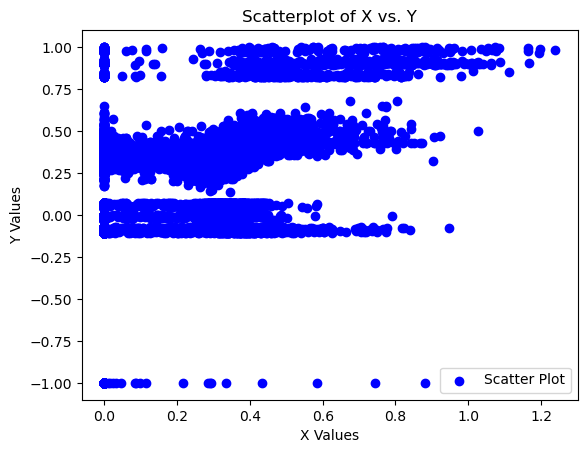

In [41]:
print(predictions.max())
print(ground_truth)

plt.scatter(predictions, ground_truth, c='blue', marker='o', label='Scatter Plot')
plt.xlabel('X Values')
plt.ylabel('Y Values')
plt.title('Scatterplot of X vs. Y')
plt.legend()
plt.show()

In [55]:
model = DQN(input_size, output_size)
model.load_state_dict(torch.load("model_test_4_90.pth"))
model.to(device)
model.eval()
torch.manual_seed(123)
np.random.seed(123)

In [56]:
inputs = test_dataset[:][0].to(device)
targets = test_dataset[:][1].to(device)
baseline = torch.zeros(1, 42).to(device)
print(inputs.shape, targets.shape, baseline.shape)

torch.Size([6917, 42]) torch.Size([6917, 7]) torch.Size([1, 42])


In [57]:
prediction_score, pred_label_idx = torch.topk(targets, 1)
pred_label_idx.squeeze_()
print(prediction_score[:, 0], "\n", pred_label_idx)

tensor([0.4200, 0.6036, 0.4614,  ..., 0.3825, 0.4211, 0.4286], device='cuda:0') 
 tensor([1, 3, 2,  ..., 2, 1, 6], device='cuda:0')


In [58]:
# import gc
# torch.cuda.empty_cache()
# gc.collect()

17582

In [59]:
# attributions, delta = ig.attribute(inputs, baseline, target=0, return_convergence_delta=True)
# analyzer_type = "InputXGradient"
# analyzer_type = "IntegratedGradient"

def captum_LRP():
    ig = LRP(model)
    ig_attr = ig.attribute(inputs, target=pred_label_idx)
    ig_attr = ig_attr.cpu()
    print(ig_attr, ig_attr.shape)
    return ig_attr.detach().numpy()

def captum_InputXGradient():
    # Gradient * inputs
    ig = InputXGradient(model)
    ig_attr = ig.attribute(inputs, target=pred_label_idx)
    ig_attr = ig_attr.cpu()
    print(ig_attr, ig_attr.shape)
    return ig_attr.detach().numpy()
    
def captum_IntegratedGradient():
    # Integrated Gradients
    ig = IntegratedGradients(model)
    ig_attr = ig.attribute(inputs, target=pred_label_idx, n_steps=1000, internal_batch_size=inputs.shape[0]*3)
    ig_attr = ig_attr.cpu()
    print(ig_attr, ig_attr.shape)
    return ig_attr.detach().numpy()

def captum_GuidedBackprop():
    # Guided Backprop
    ig = GuidedBackprop(model)
    ig_attr = ig.attribute(inputs, target=pred_label_idx)
    ig_attr = ig_attr.cpu()
    print(ig_attr, ig_attr.shape)
    return ig_attr.detach().numpy()
    
def captum_GradientShap():
    # Integrated Gradients
    ig = GradientShap(model)
    ig_attr = ig.attribute(inputs, target=pred_label_idx)
    ig_attr = ig_attr.cpu()
    print(ig_attr, ig_attr.shape)
    return ig_attr.detach().numpy()
    

# ig_attr = ig_attr.detach().numpy()

# ig_attr_argmax = ig_attr.argmax(0)
# ig_attr_sum = ig_attr.sum(0)
# ig_attr_positives = np.sum(np.maximum(ig_attr, 0), axis=0)
# ig_attr_negatives = np.sum(np.minimum(ig_attr, 0), axis=0)
# ig_attr_mean = ig_attr.mean(0)

# ig_attr_test_sum = ig_attr_test.detach().numpy().sum(0)
# ig_attr_test_norm_sum = ig_attr_test_sum / np.linalg.norm(ig_attr_test_sum, ord=1)


# print('IG Attributions:', ig_attr_test_sum, ig_attr_test_norm_sum)
# print('Convergence Delta:', delta)
# print(attributions.shape, delta.shape)

tensor([[-0.0000, -0.0000,  0.0000,  ...,  0.0130,  0.0000,  0.0000],
        [-0.0000,  0.0000,  0.0000,  ..., -0.0080, -0.0689,  0.0150],
        [ 0.0000,  0.0562,  0.0000,  ...,  0.0422, -0.0380, -0.0000],
        ...,
        [-0.0000,  0.0000, -0.0000,  ...,  0.0000,  0.0401, -0.0139],
        [ 0.0000,  0.0000, -0.0000,  ...,  0.0247, -0.0421, -0.0000],
        [-0.0326, -0.0840, -0.0787,  ..., -0.0624, -0.0106, -0.0500]],
       grad_fn=<ToCopyBackward0>) torch.Size([6917, 42])
tensor([[-0.0000, -0.0000,  0.0000,  ...,  0.0130,  0.0000,  0.0000],
        [-0.0000,  0.0000,  0.0000,  ..., -0.0080, -0.0689,  0.0150],
        [ 0.0000,  0.0562,  0.0000,  ...,  0.0422, -0.0380, -0.0000],
        ...,
        [-0.0000,  0.0000, -0.0000,  ...,  0.0000,  0.0401, -0.0139],
        [ 0.0000,  0.0000, -0.0000,  ...,  0.0247, -0.0421, -0.0000],
        [-0.0326, -0.0840, -0.0787,  ..., -0.0624, -0.0106, -0.0500]],
       grad_fn=<ToCopyBackward0>) torch.Size([6917, 42])
tensor([[ 0.0000, 

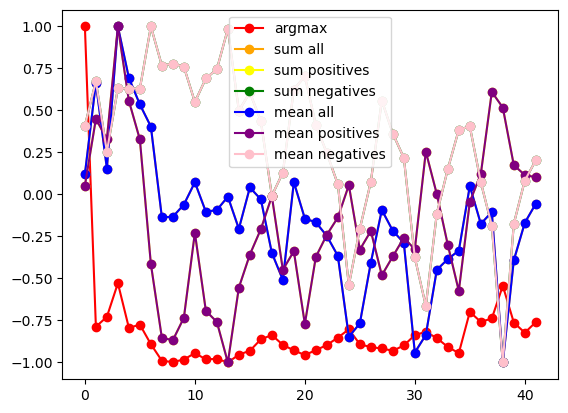

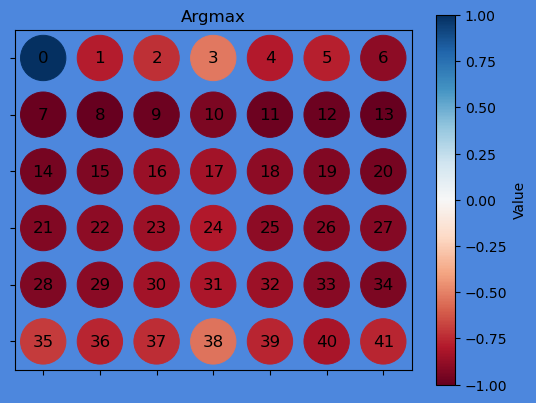

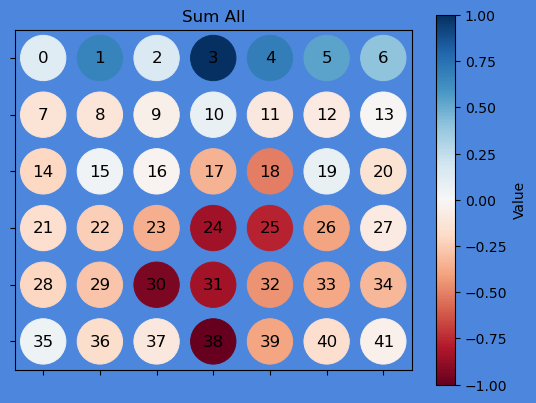

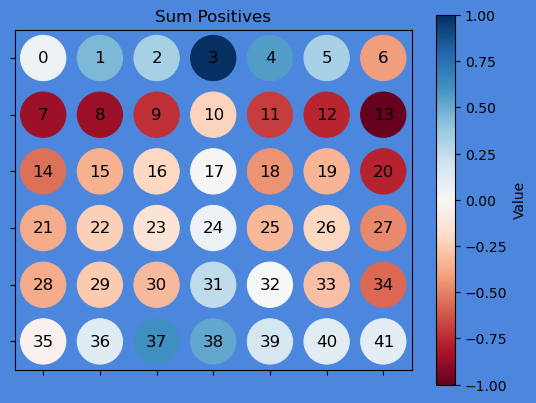

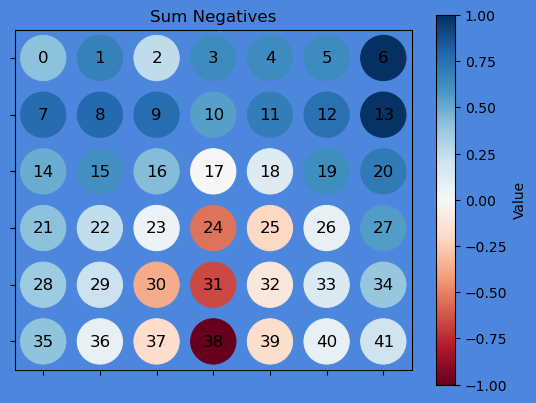

...

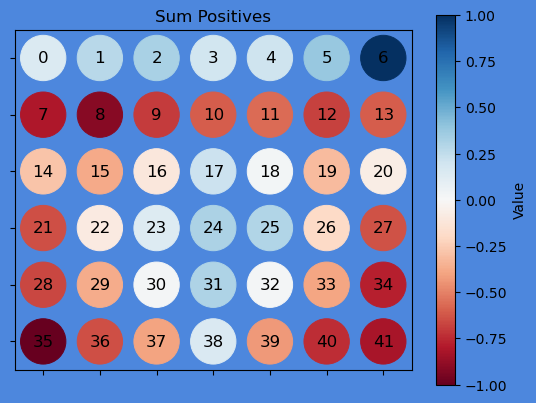

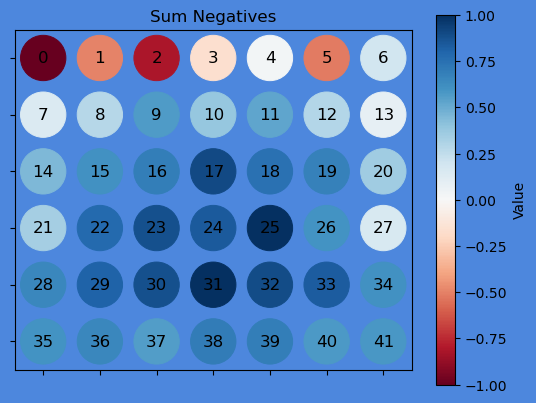

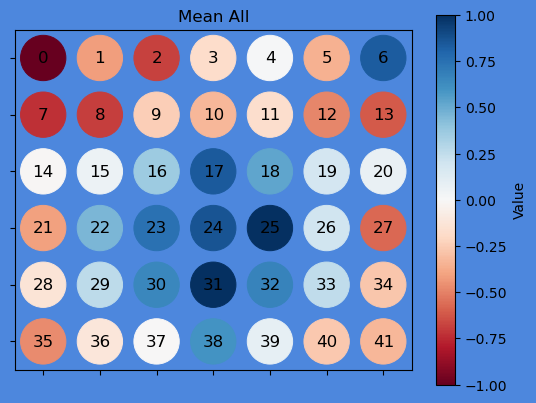

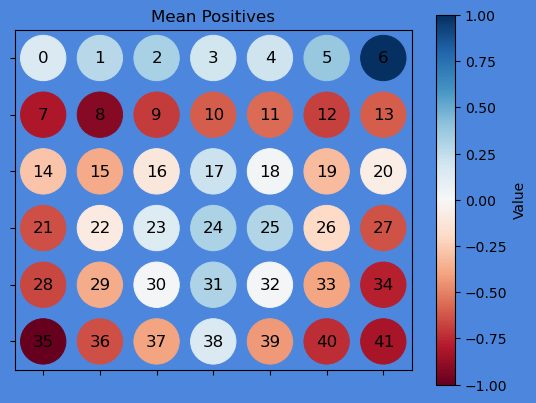

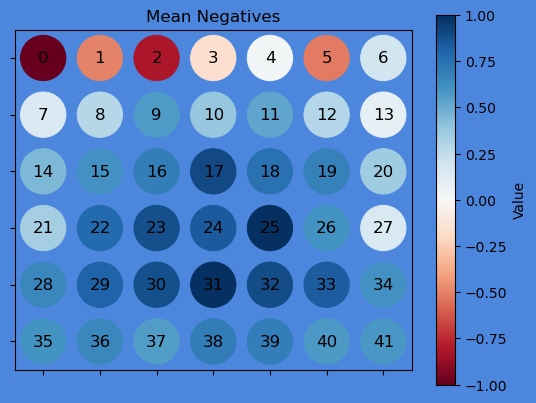

In [62]:
# ig_attr_1 = captum_InputXGradient()
# ig_attr_2 = captum_integratedGradient()

# for ig_attr in [captum_InputXGradient(), captum_IntegratedGradient(), captum_GuidedBackprop()]:

for ig_attr, analyzer_type in zip([captum_LRP(), captum_InputXGradient(), captum_IntegratedGradient(), captum_GuidedBackprop()], ["lrp", "inputXgradient", "integratedGradient", "guidedBackprop"]):
    vic1, vic2, vic3, vic4, vic5, vic6, vic7 = plot_graphs(ig_attr)

    visualize_cell_importance(vic1, title='Argmax', name=date+'_captum_'+analyzer_type+'_'+file_name+'_argmax')
    visualize_cell_importance(vic2, title='Sum All', name=date+'_captum_'+analyzer_type+'_'+file_name+'_sum_all')
    visualize_cell_importance(vic3, title='Sum Positives', name=date+'_captum_'+analyzer_type+'_'+file_name+'_sum_pos')
    visualize_cell_importance(vic4, title='Sum Negatives', name=date+'_captum_'+analyzer_type+'_'+file_name+'_sum_neg')
    visualize_cell_importance(vic5, title='Mean All', name=date+'_captum_'+analyzer_type+'_'+file_name+'_mean_all')
    visualize_cell_importance(vic6, title='Mean Positives', name=date+'_captum_'+analyzer_type+'_'+file_name+'_mean_pos')
    visualize_cell_importance(vic7, title='Mean Negatives', name=date+'_captum_'+analyzer_type+'_'+file_name+'_mean_neg')

# Using Innvestigate (XAI-method) on TensorFlow model
## TensorFlow

In [42]:
import tensorflow as tf
import innvestigate
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, MinMaxScaler
from tensorflow.keras import layers

from sklearn.manifold import TSNE

np.set_printoptions(precision=3)
tf.compat.v1.disable_eager_execution()

print(tf.__version__)
print('Import successful')

2.12.1
Import successful


In [43]:
# Loading the data
# data = pd.read_csv("./02_09_dataset_3_seeded_10/02_09_dataset_3_seeded_10.csv", sep=';', decimal='.')
data = pd.read_csv("./"+file_name+"/"+file_name+".csv", sep=';', decimal='.')
print("input data rows: {}".format(data.shape[0]))

# Hyperparameters
input_size = 42
output_size = 7
learning_rate = 0.001
discount_factor = 0.99
batch_size = 64
num_epochs = 100

# Preprocessing
# Maybe one-hot encoding for score targets instead of LabelEncoder since it can be 'inf-', 'inf' and floats
df = pd.DataFrame(data)

X = df.drop(['column_0_score', 'column_1_score', 'column_2_score', 'column_3_score', 'column_4_score', 'column_5_score', 
             'column_6_score'], axis=1)
y = df[['column_0_score', 'column_1_score', 'column_2_score', 'column_3_score', 'column_4_score', 'column_5_score', 
        'column_6_score']]

# Normalizing the scores to contain values between -1 and 1 instead of -9999 and 1000
normalized_y = (y - (y.min().min())) / (y.max().max() - (y.min().min())) * 2 - 1

y = normalized_y

# Tensorflow DataLoader
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
# train_dataset = train_dataset.shuffle(buffer_size=len(X_train)).batch(batch_size)

# test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test))
# test_dataset = test_dataset.batch(batch_size)

y_test.head(50)

input data rows: 34581


,column_0_score,column_1_score,column_2_score,column_3_score,column_4_score,column_5_score,column_6_score
14426,0.415000,0.420000,0.418571,0.413929,0.390357,0.408571,0.408571
12063,0.570357,0.570714,0.428571,0.603571,0.576429,0.567143,0.599643
9682,0.428214,-1.000000,0.461429,0.457143,0.432143,0.417143,0.424643
27897,0.414286,0.410714,0.393929,0.417143,0.419643,0.417500,0.412857
14091,-0.096071,0.423571,0.399286,0.428929,0.427143,0.427857,0.425714
10347,0.396071,0.431786,-1.000000,-1.000000,-1.000000,0.428571,0.428571
3798,0.433571,0.440357,0.445714,0.450714,0.455357,0.465000,0.450714
16086,-1.000000,0.460357,-1.000000,-1.000000,-0.106429,-1.000000,0.428214
31898,-1.000000,-1.000000,-1.000000,-1.000000,0.983929,-1.000000,-1.000000
926,0.382143,0.388571,0.391786,0.393929,-0.097500,0.381786,0.419286


Dataset random mit floats machen damit die keinen wirklich einfluss haben ... idk  
lr = 0.0001, df = 0.99 => loss: 0.0974 - val_loss: 0.1570  
lr = 0.00005, df = 0.98 => loss: 0.0994 - val_loss: 0.1638  
lr = 0.01, df = 0.99 => loss: 0.0952 - val_loss: 0.1594  
lr = 0.01, df = 0.98 => loss: 0.0962 - val_loss: 0.1619  

In [44]:
# Hyperparameters
input_size = 42
output_size = 7
learning_rate = 0.001
discount_factor = 0.99
batch_size = 64
num_epochs = 500

class CustomAccuracy(tf.keras.metrics.Metric):
    def __init__(self, name = 'c_acc', **kwargs):
        super(CustomAccuracy, self).__init__(name = name, **kwargs)
        self.count = self.add_weight(name = 'count', initializer = 'zeros')
        self.total = self.add_weight(name = 'total', initializer = 'zeros')
#         self.custom_accuracy = self.add_weight(name = 'custom_acc', initializer = 'zeros')
    
    def update_state(self, y_true, y_pred, sample_weight = None): 
        max_true_position = tf.argmax(y_true, axis=-1)
        max_pred_position = tf.argmax(y_pred, axis=-1)
        max_true_score = tf.reduce_max(tf.gather(y_true, max_pred_position, axis=-1), axis=-1)
        max_pred_score = tf.reduce_max(tf.gather(y_pred, max_pred_position, axis=-1), axis=-1)
        
        correct_pick = tf.logical_or(
            tf.math.equal(max_pred_position, max_true_position),
            tf.logical_or(
                tf.math.greater_equal(max_true_score, 0.9),
                tf.math.greater_equal(max_pred_score, max_true_score * 0.9)
            )
        )
        
        self.count.assign_add(tf.cast(tf.shape(correct_pick)[0], tf.float32))
        self.total.assign_add(tf.reduce_sum(tf.cast(correct_pick, tf.float32)))
        
    def result(self):
        return self.total / self.count
    
    def reset_state(self):
        self.count.assign(0.0)
        self.total.assign(0.0)

# Define the model
# activations: relu, linear, sigmoid
model = tf.keras.Sequential(
    [
        layers.Input(shape=(input_size,)),
        layers.Dense(256, activation='relu'),
        layers.Dense(256, activation='relu'),
        layers.Dense(256, activation='relu'),
        layers.Dense(256, activation='relu'),
        layers.Dense(128, activation='relu'),
        layers.Dense(64, activation='relu'),
        layers.Dense(output_size)  # No activation for final layer
    ]
)

# Build the model
# model = build_model(input_size, output_size)

# model.run_eagerly = True

# Compile the model
model.compile(optimizer='adam', loss='mse', metrics=["acc", CustomAccuracy()])
# run_eagerly=True

# Early stopping
callback = tf.keras.callbacks.EarlyStopping(monitor='val_c_acc', patience=15)

# Train the model
model.fit(X_train, y_train, epochs=num_epochs, batch_size=batch_size, callbacks=[callback], validation_split=0.2)

Train on 22131 samples, validate on 5533 samples
Epoch 1/500
22131/22131 [==============================] - 1s 46us/sample - loss: 0.1406 - acc: 0.1934 - c_acc: 0.4714 - val_loss: 0.0569 - val_acc: 0.2926 - val_c_acc: 0.4760
Epoch 2/500
 1536/22131 [=>............................] - ETA: 0s - loss: 0.0513 - acc: 0.2357 - c_acc: 0.4779

D:\anaconda3\lib\site-packages\keras\engine\training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


22131/22131 [==============================] - 1s 36us/sample - loss: 0.0411 - acc: 0.2679 - c_acc: 0.5101 - val_loss: 0.0321 - val_acc: 0.2955 - val_c_acc: 0.5264
Epoch 3/500
22131/22131 [==============================] - 1s 36us/sample - loss: 0.0270 - acc: 0.3043 - c_acc: 0.5496 - val_loss: 0.0287 - val_acc: 0.2594 - val_c_acc: 0.5559
Epoch 4/500
22131/22131 [==============================] - 1s 38us/sample - loss: 0.0232 - acc: 0.3226 - c_acc: 0.5736 - val_loss: 0.0259 - val_acc: 0.3495 - val_c_acc: 0.5786
Epoch 5/500
22131/22131 [==============================] - 1s 38us/sample - loss: 0.0210 - acc: 0.3376 - c_acc: 0.5950 - val_loss: 0.0249 - val_acc: 0.3181 - val_c_acc: 0.5989
Epoch 6/500
22131/22131 [==============================] - 1s 37us/sample - loss: 0.0189 - acc: 0.3537 - c_acc: 0.6123 - val_loss: 0.0234 - val_acc: 0.3269 - val_c_acc: 0.6150
Epoch 7/500
22131/22131 [==============================] - 1s 37us/sample - loss: 0.0175 - acc: 0.3583 - c_acc: 0.6272 - val_loss: 0

22131/22131 [==============================] - 1s 37us/sample - loss: 0.0034 - acc: 0.4257 - c_acc: 0.7869 - val_loss: 0.0173 - val_acc: 0.4086 - val_c_acc: 0.7869
Epoch 95/500
22131/22131 [==============================] - 1s 36us/sample - loss: 0.0023 - acc: 0.4411 - c_acc: 0.7870 - val_loss: 0.0168 - val_acc: 0.3454 - val_c_acc: 0.7869
Epoch 96/500
22131/22131 [==============================] - 1s 36us/sample - loss: 0.0015 - acc: 0.4550 - c_acc: 0.7870 - val_loss: 0.0164 - val_acc: 0.3481 - val_c_acc: 0.7869
Epoch 97/500
22131/22131 [==============================] - 1s 44us/sample - loss: 0.0013 - acc: 0.4551 - c_acc: 0.7871 - val_loss: 0.0164 - val_acc: 0.4101 - val_c_acc: 0.7869
Epoch 98/500
22131/22131 [==============================] - 1s 40us/sample - loss: 0.0013 - acc: 0.4636 - c_acc: 0.7871 - val_loss: 0.0163 - val_acc: 0.3953 - val_c_acc: 0.7869
Epoch 99/500
22131/22131 [==============================] - 1s 41us/sample - loss: 0.0012 - acc: 0.4594 - c_acc: 0.7871 - val_lo

In [48]:
predictions = model.predict(X_test[:])
ground_truth = y_test[:]

1.1366197
       column_0_score  column_1_score  column_2_score  column_3_score  \
14426        0.415000        0.420000        0.418571        0.413929   
12063        0.570357        0.570714        0.428571        0.603571   
9682         0.428214       -1.000000        0.461429        0.457143   
27897        0.414286        0.410714        0.393929        0.417143   
14091       -0.096071        0.423571        0.399286        0.428929   
...               ...             ...             ...             ...   
22584        0.382143        0.384643        0.406786        0.416071   
2398        -1.000000       -1.000000        0.981429       -1.000000   
3842         0.338929        0.348929        0.382500        0.320357   
22825        0.388571        0.421071        0.382143        0.071071   
25848       -1.000000       -1.000000       -1.000000       -1.000000   

       column_4_score  column_5_score  column_6_score  
14426        0.390357        0.408571        0.408571  
1

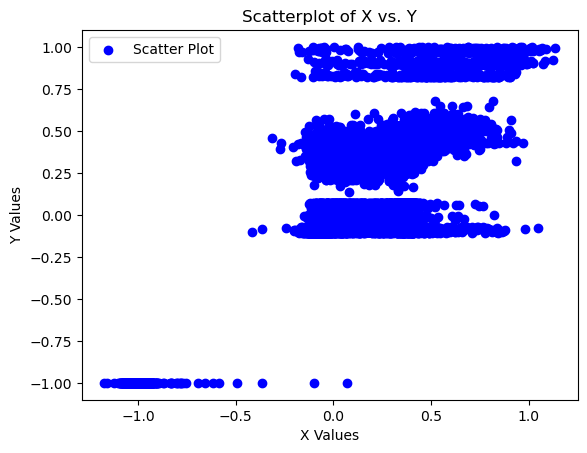

In [49]:
print(predictions.max())
print(ground_truth)

plt.scatter(predictions, ground_truth, c='blue', marker='o', label='Scatter Plot')
plt.xlabel('X Values')
plt.ylabel('Y Values')
plt.title('Scatterplot of X vs. Y')
plt.legend()
plt.show()

In [44]:
board_nums = [0,0,0,-1,0,0,0,0,0,-1,-1,0,0,0,0,0,1,1,0,1,0,0,0,1,-1,0,1,0,-1,1,1,1,-1,-1,0,-1,-1,-1,1,1,1,-1]
board_nums2 = [0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,-1,-1,0,-1,0,0,0,-1,1,-1,-1,0,1,-1,-1,-1,1,1,0,1,1,1,-1,-1,-1,1]
board_nums3 = [-1,0,0,-1,0,1,1,1,0,1,1,0,-1,-1,1,0,-1,-1,0,-1,1,-1,0,1,1,0,1,1,-1,0,-1,1,0,-1,-1,-1,-1,1,-1,1,-1,1]
score = [1120,124,1103,-4000,1354,1113,1101]
score2 = [-1408,-1495,-1445,-4000,-1473,-1429,-1453]
score3 = [-4000,1118,1158,-4000,199,-4000,-4000]

for boards, scoree in zip([board_nums, board_nums2, board_nums3],[score, score2, score3]):
    board = np.full((1,42),boards)
    df = pd.DataFrame(board)
    predictions = model.predict(board)
    print(scoree)
    print(predictions)


[1120, 124, 1103, -4000, 1354, 1113, 1101]
[[  -57.118  -846.066    14.836 -4122.305   237.533  -188.958  -707.417]]
[-1408, -1495, -1445, -4000, -1473, -1429, -1453]
[[-1432.069 -1442.268 -1164.25  -3965.885 -1432.374  -740.045 -1754.457]]
[-4000, 1118, 1158, -4000, 199, -4000, -4000]
[[-4317.168  -121.155    53.851 -4099.296  -826.325 -3913.94  -4000.369]]
   0   1   2   3   4   5   6   7   8   9   ...  32  33  34  35  36  37  38  \
0  -1   0   0  -1   0   1   1   1   0   1  ...   0  -1  -1  -1  -1   1  -1   

   39  40  41  
0   1  -1   1  

[1 rows x 42 columns]


D:\anaconda3\lib\site-packages\keras\engine\training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


In [2]:
# # sess = tf.compat.v1.InteractiveSession()

# predictions = model.predict(X_test)

# predictions = tf.constant(predictions)
# targets = tf.constant(y_test)

# predicted_rows = tf.argmax(predictions, axis=1)
# target_rows = tf.argmax(targets, axis=1)

# accuracy = tf.equal(predicted_rows, target_rows)
# accuracy = tf.cast(accuracy, dtype=tf.float32)
# accuracy = tf.reduce_mean(accuracy)

# # print(accuracy.eval())
# # sess.close()

# with tf.compat.v1.Session():
#     # We can also use 'c.eval()' here.
#     lol = tf.argmax(predictions, axis=1).eval()
#     print(tf.reduce_mean(lol).eval())
#     print(tf.math.bincount(lol).eval())
#     print(accuracy.eval())

In [3]:
# gradient_analyzer = innvestigate.create_analyzer('gradient', model)
# analysis = gradient_analyzer.analyze(X)

# X_embedded = TSNE().fit_transform(analysis)


D:\anaconda3\lib\site-packages\keras\engine\training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


[[ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ... -1.  0.  0.]
 [ 0.  0.  0. ...  1.  0.  0.]
 ...
 [-1.  0.  1. ...  0. -1. -1.]
 [ 1.  0. -1. ...  0.  1.  1.]
 [-1.  0.  1. ...  0. -1. -1.]]
input


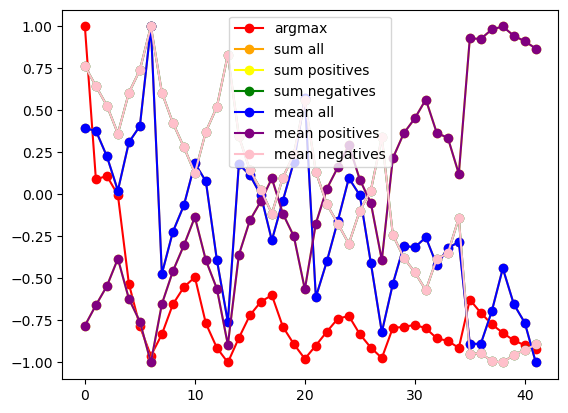

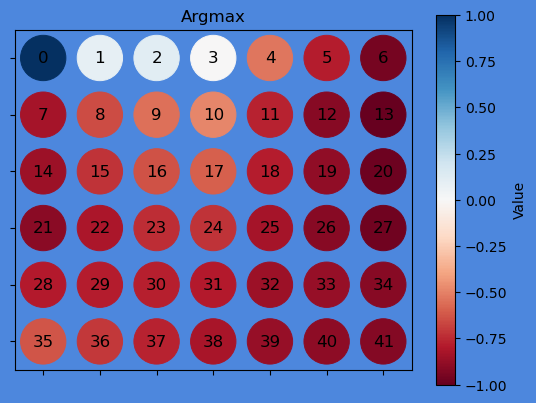

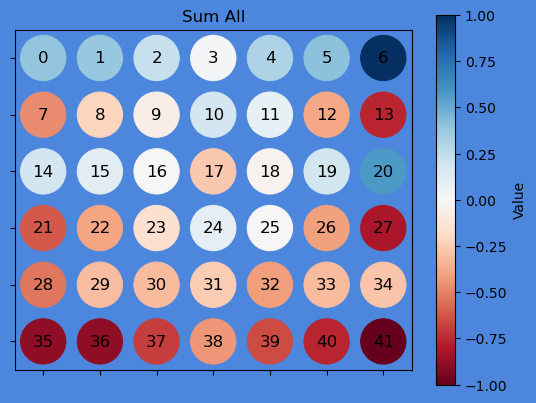

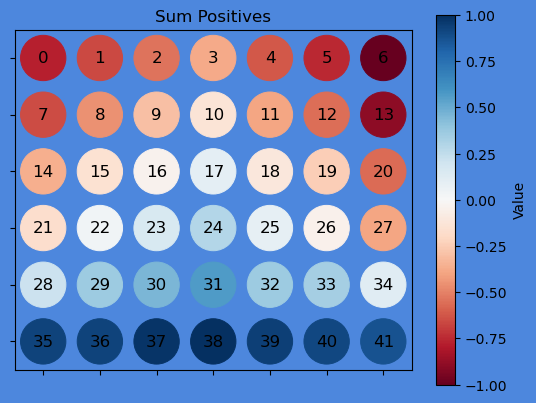

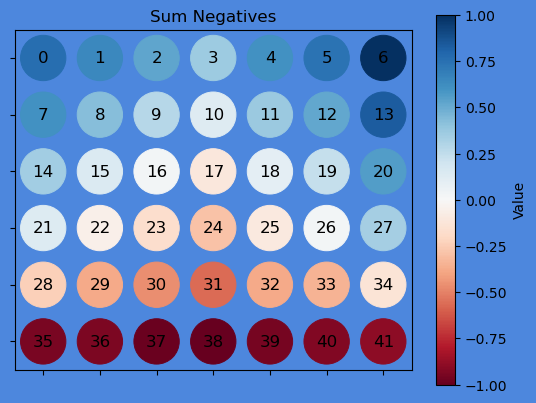

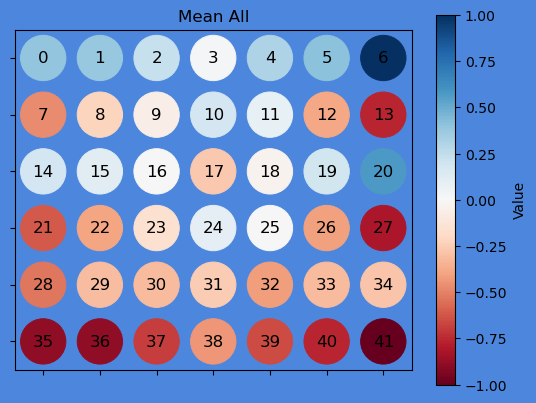

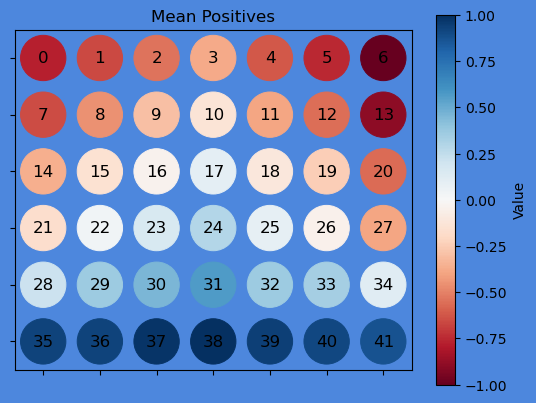

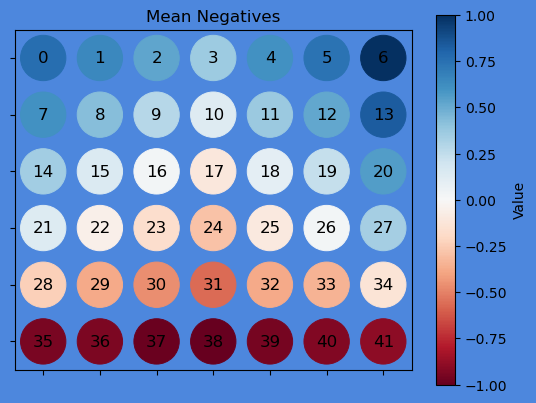

[[ 0.839 -1.1    0.035 ...  0.65  -1.301  1.696]
 [-0.946 -0.579  0.392 ... -2.201 -0.724 -1.109]
 [-0.67  -1.222  1.221 ...  0.719 -0.438 -0.227]
 ...
 [-1.375  1.486  1.884 ... -0.709 -2.967 -0.894]
 [ 0.432 -0.119 -3.281 ...  0.121  0.572  0.89 ]
 [-2.533 -0.584  2.172 ...  1.348 -2.583 -3.413]]
random


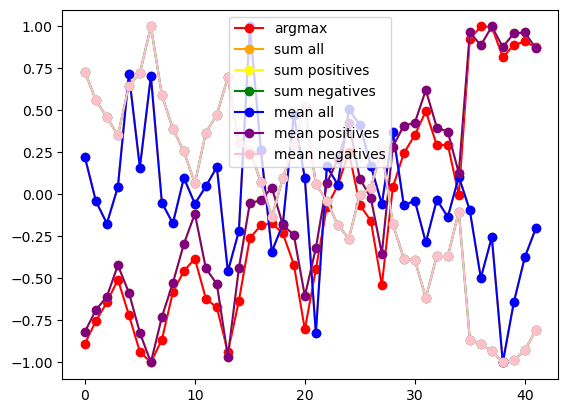

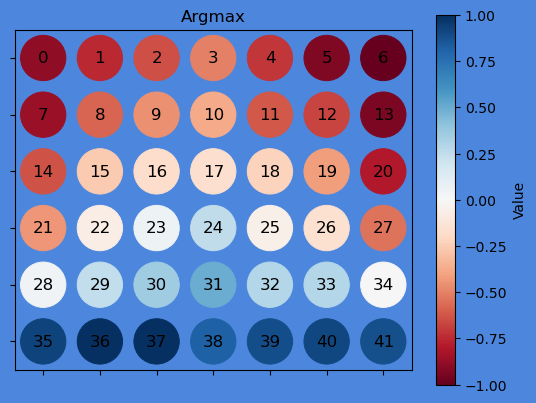

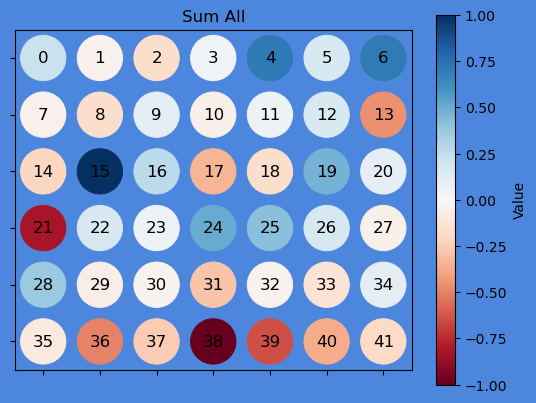

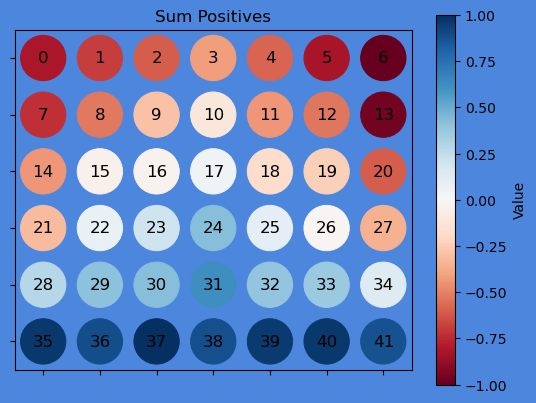

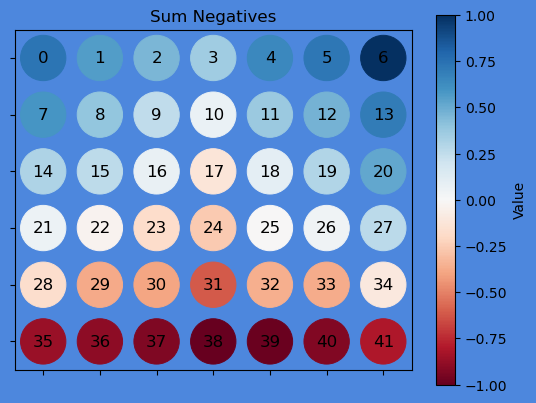

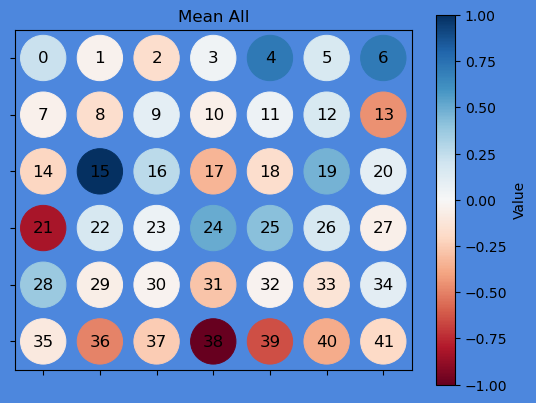

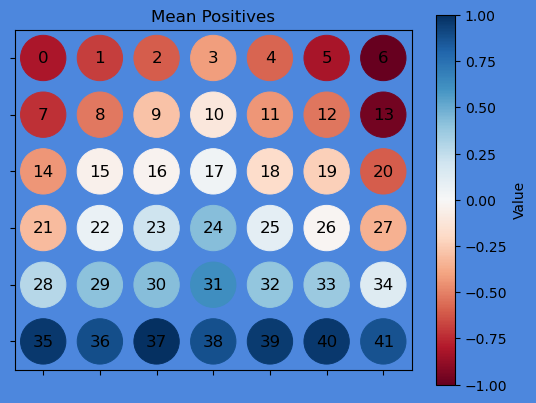

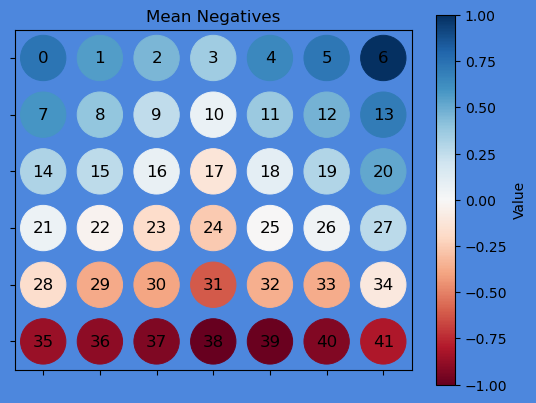

[[ 0.     0.     0.    ...  0.     0.     0.   ]
 [-0.021 -0.016  0.002 ...  0.019  0.019 -0.002]
 [-0.011 -0.001  0.002 ...  0.008 -0.002  0.009]
 ...
 [-0.062 -0.073  0.2   ... -0.067 -0.043 -0.007]
 [ 0.022 -0.08  -0.045 ... -0.081  0.007 -0.026]
 [-0.2    0.352 -0.456 ...  0.064  0.057 -0.137]]
gradient


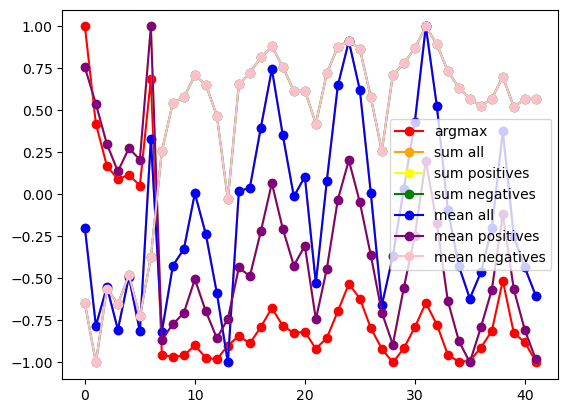

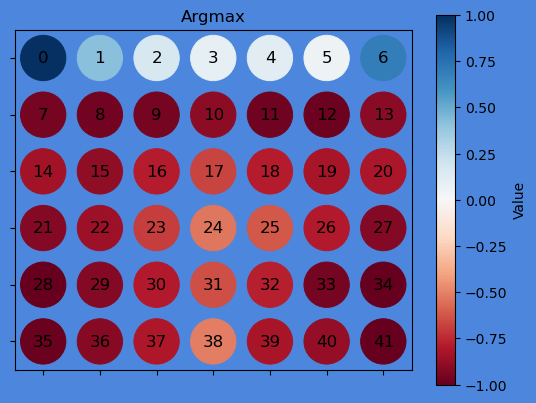

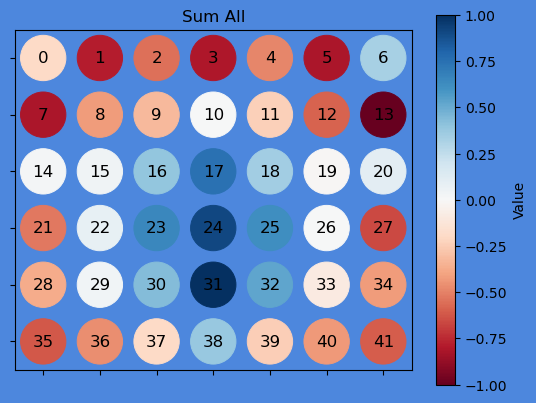

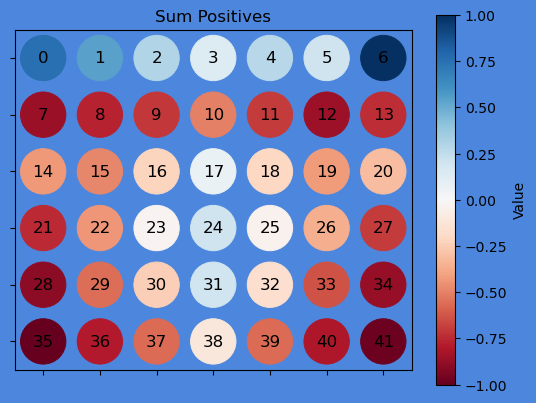

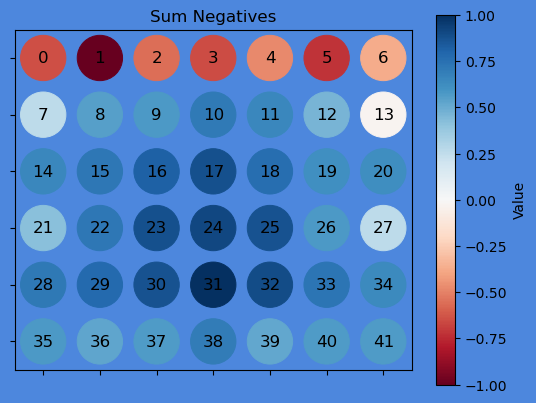

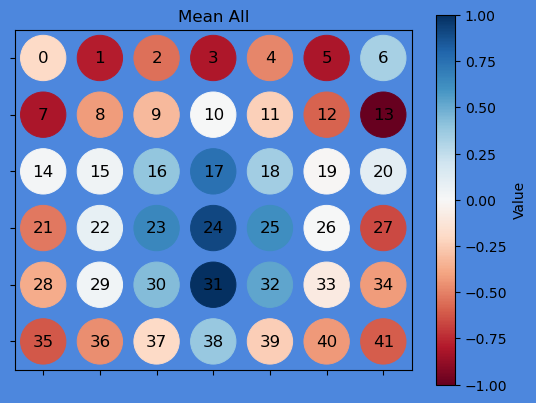

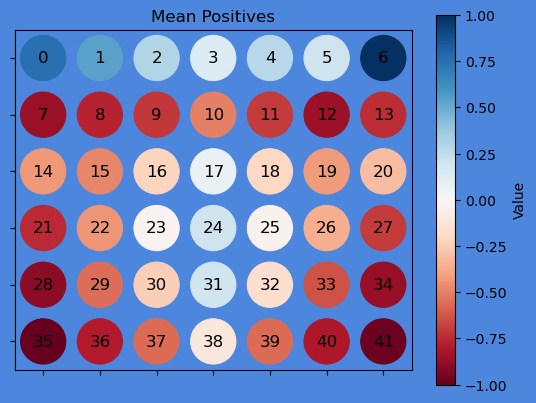

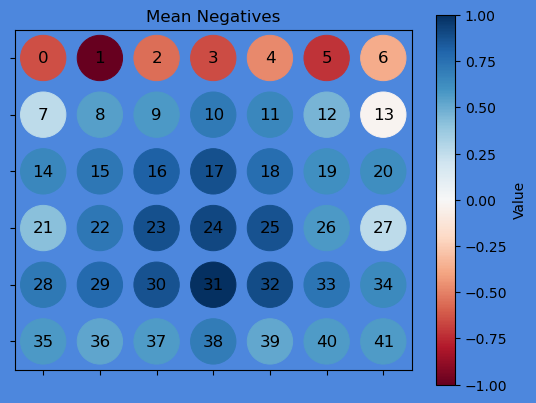

[[ 0.     0.     0.    ...  0.     0.     0.   ]
 [-0.    -0.     0.    ... -0.019  0.    -0.   ]
 [-0.    -0.     0.    ...  0.008 -0.     0.   ]
 ...
 [ 0.062 -0.     0.2   ... -0.     0.043  0.007]
 [ 0.022 -0.     0.045 ... -0.     0.007 -0.026]
 [ 0.2    0.    -0.456 ...  0.    -0.057  0.137]]
input_t_gradient


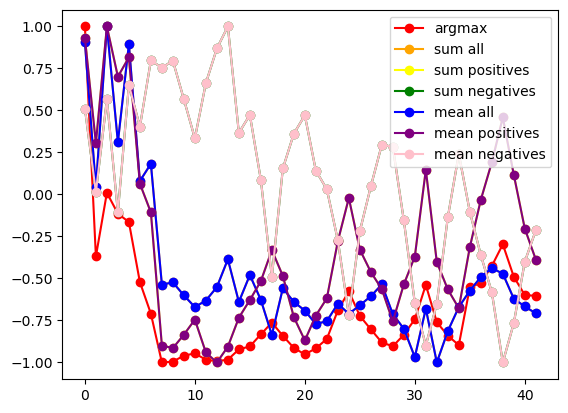

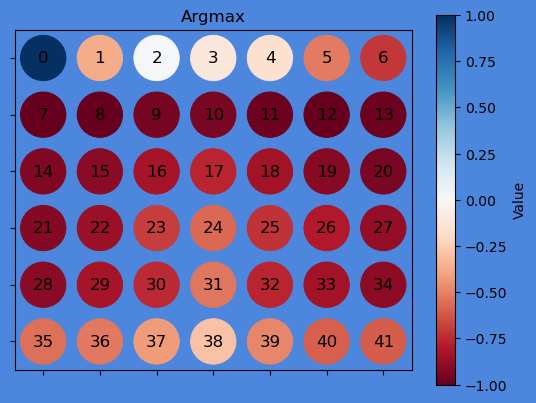

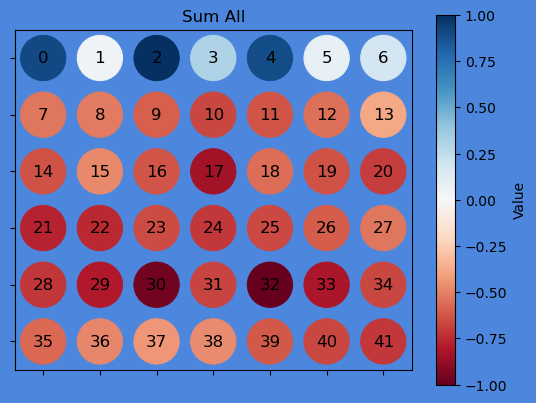

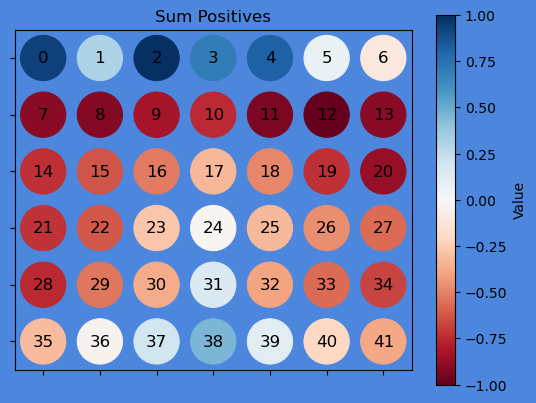

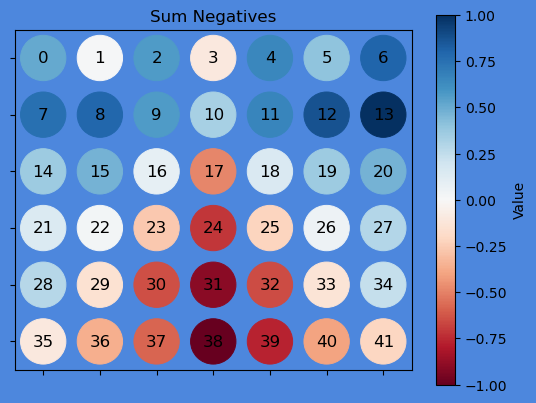

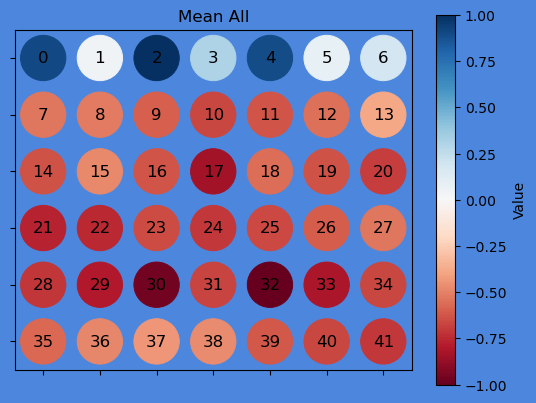

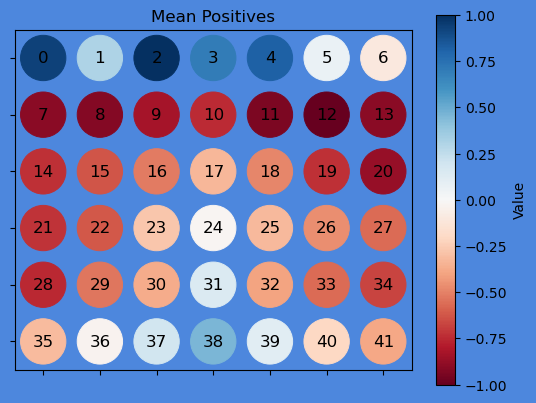

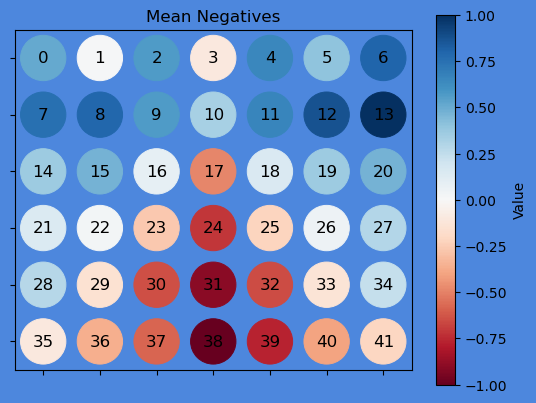

[[ 1.271e-02 -3.642e-02  4.091e-02 ...  1.423e-02  1.669e-03 -1.230e-02]
 [-2.895e-02 -5.160e-03  6.026e-02 ...  1.357e-02 -8.804e-04 -5.599e-03]
 [ 1.270e-02 -3.637e-02  4.085e-02 ...  1.421e-02  1.667e-03 -1.229e-02]
 ...
 [ 2.602e-02 -7.456e-02  8.374e-02 ...  2.913e-02  3.417e-03 -2.519e-02]
 [ 2.726e-05 -1.456e-03 -1.344e-03 ...  8.141e-04  6.665e-05  2.310e-04]
 [ 4.551e-03 -6.450e-03  1.326e-03 ...  2.730e-03 -1.651e-03  3.528e-03]]
deconvnet


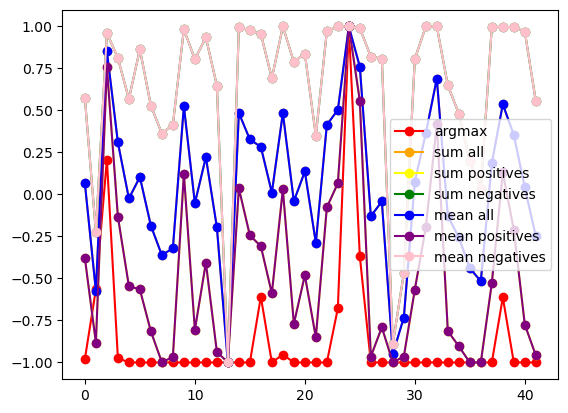

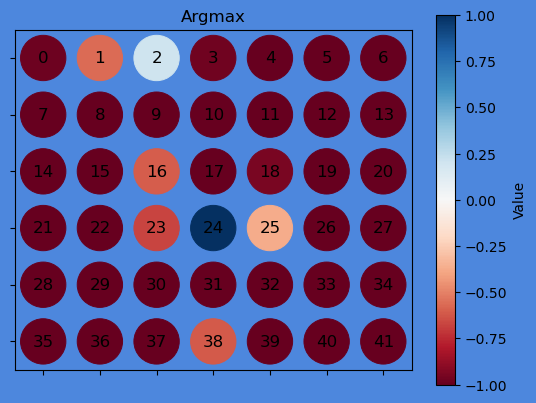

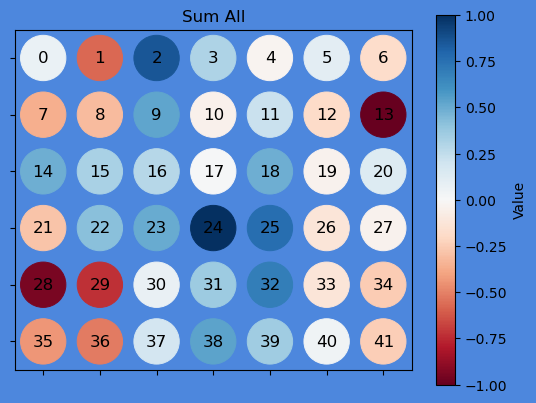

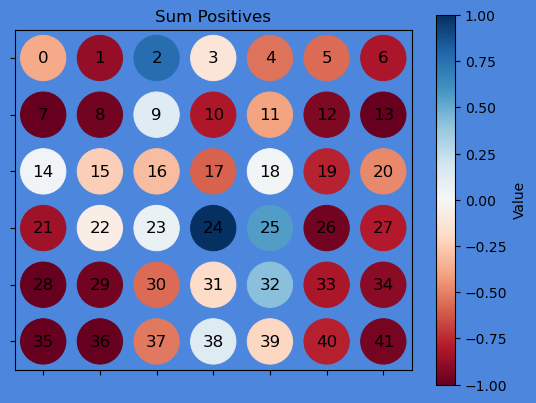

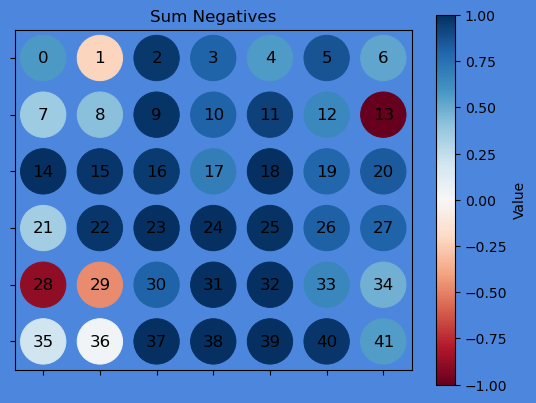

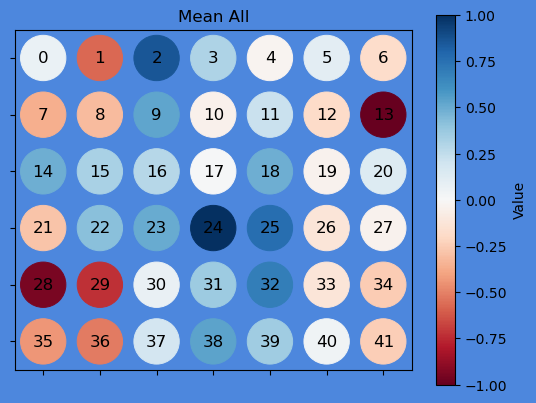

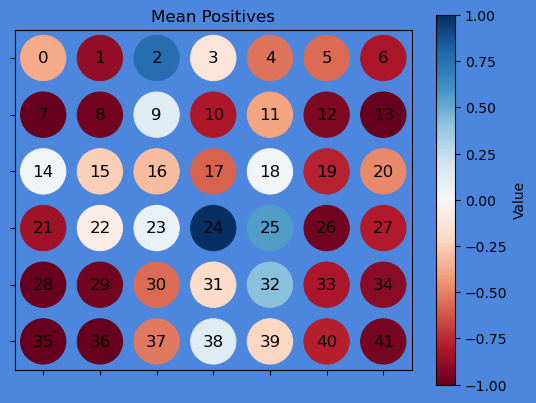

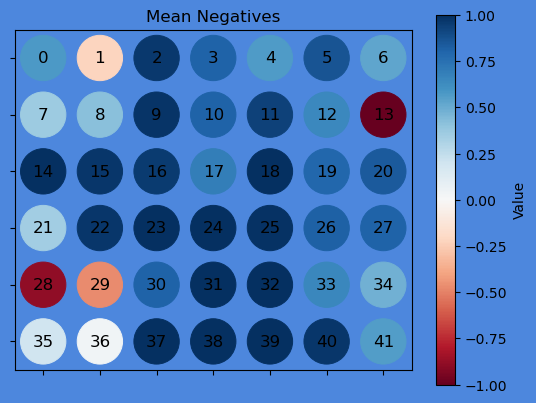

[[ 0.     0.     0.    ...  0.     0.     0.   ]
 [ 0.003 -0.002  0.002 ... -0.004 -0.002 -0.001]
 [-0.006 -0.001 -0.002 ...  0.007 -0.001  0.003]
 ...
 [-0.168 -0.028  0.155 ... -0.029 -0.037  0.001]
 [ 0.004  0.001 -0.002 ...  0.001  0.001  0.   ]
 [-0.023 -0.     0.014 ... -0.004 -0.003 -0.   ]]
guided_backprop


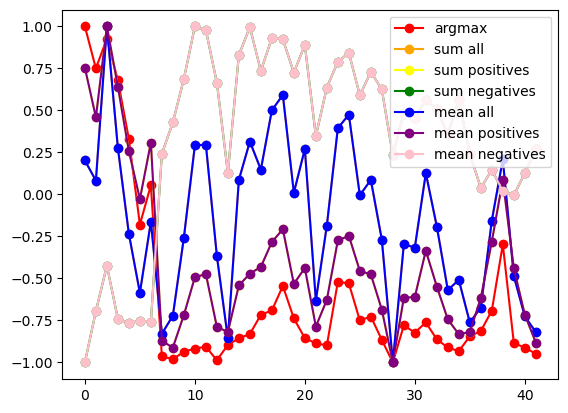

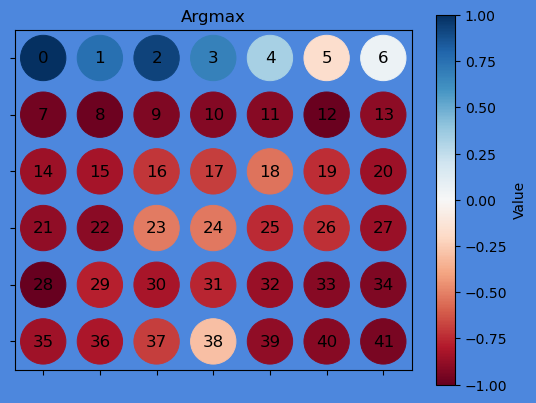

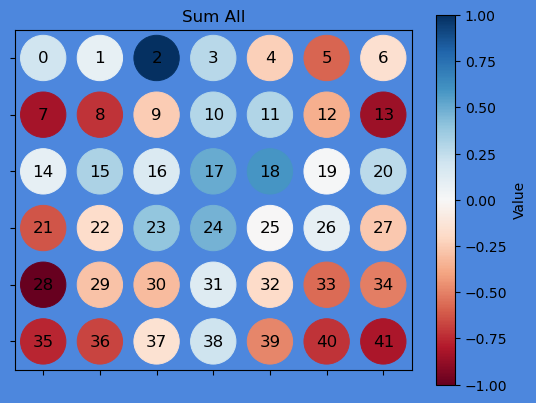

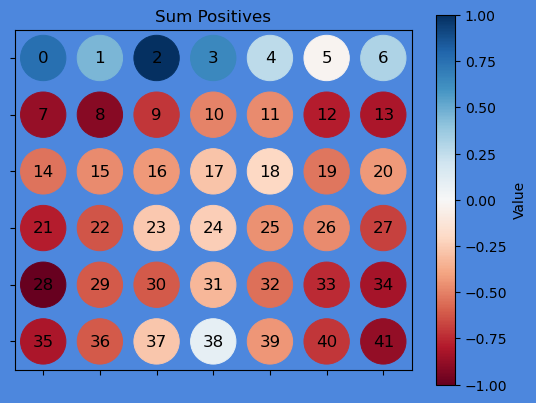

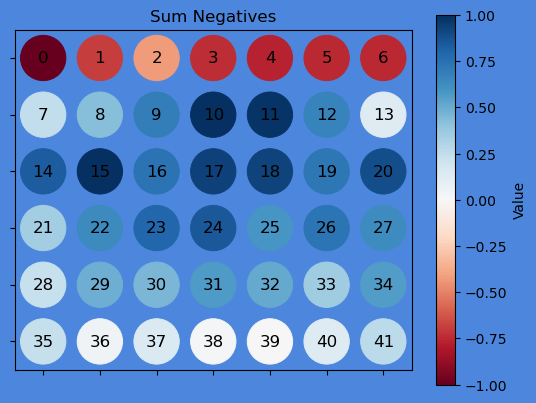

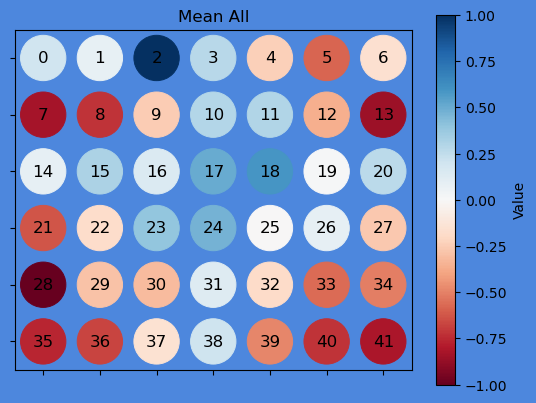

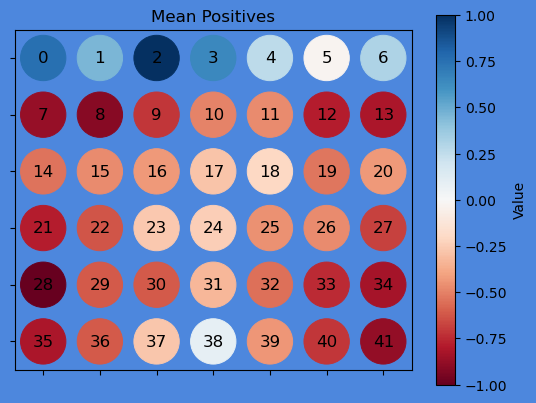

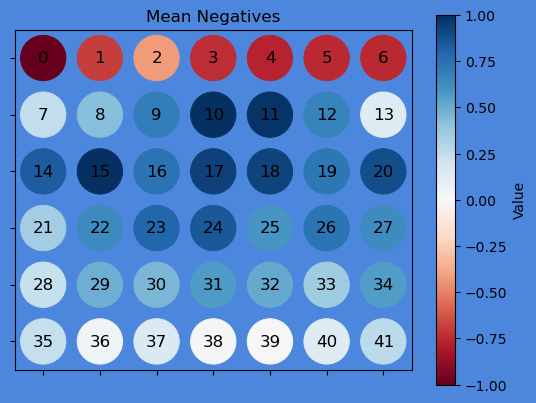

[[ 0.     0.     0.    ...  0.     0.     0.   ]
 [-0.    -0.    -0.    ... -0.007  0.     0.   ]
 [-0.    -0.    -0.    ...  0.002 -0.     0.   ]
 ...
 [ 0.067 -0.     0.193 ... -0.     0.071  0.012]
 [-0.02  -0.    -0.079 ... -0.     0.011 -0.013]
 [ 0.105  0.    -0.225 ...  0.     0.005  0.044]]
integrated_gradients


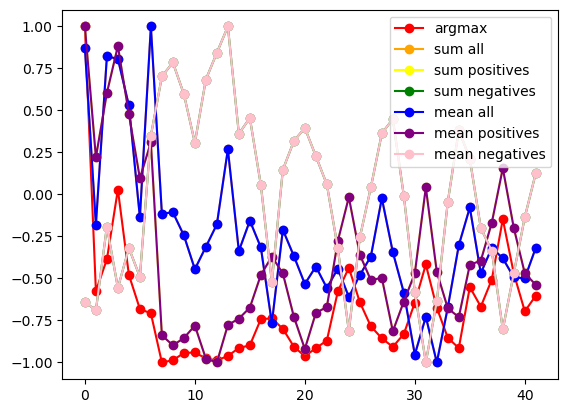

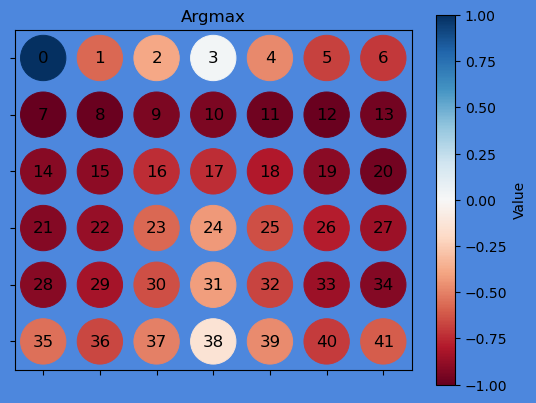

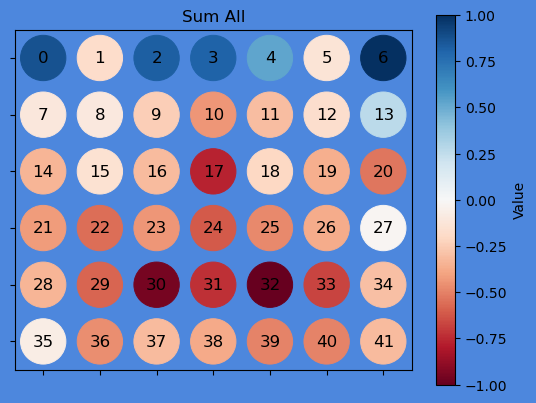

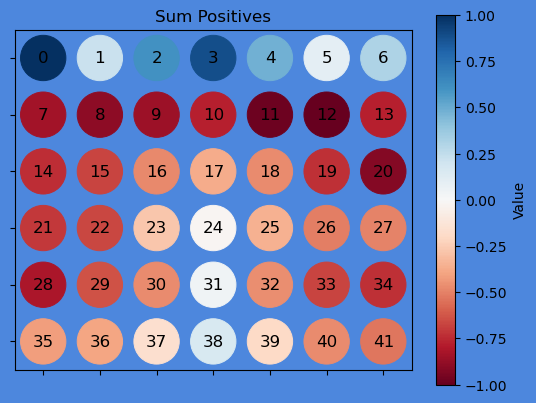

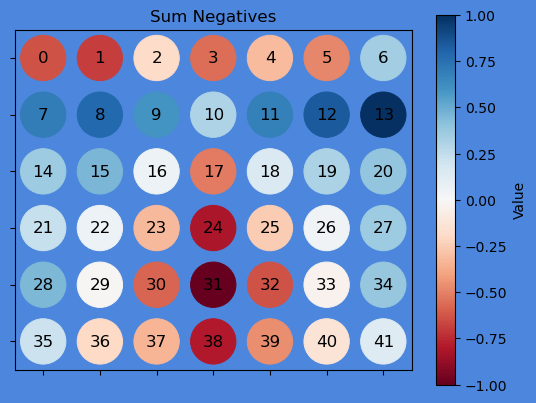

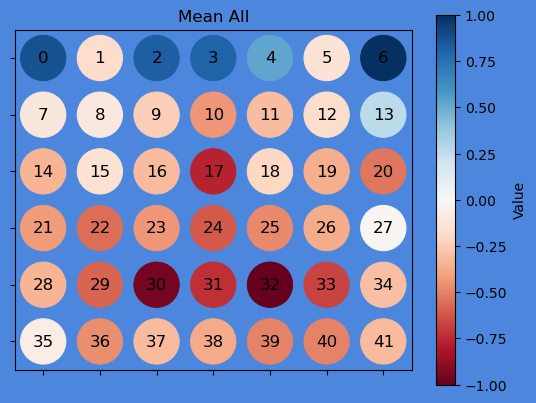

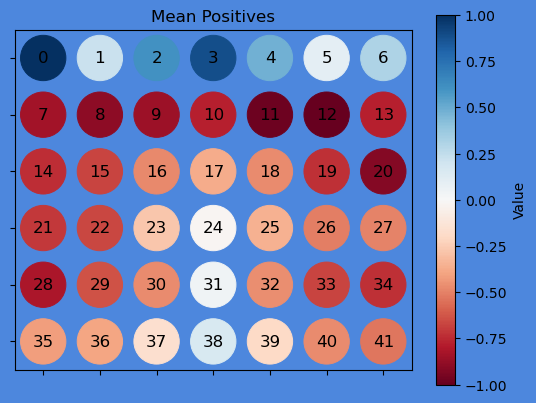

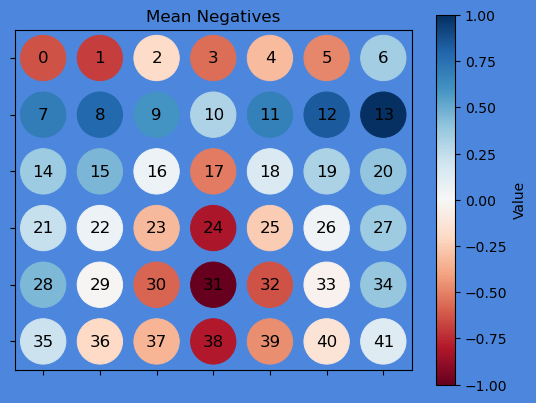

[[-0.024  0.095  0.046 ...  0.021 -0.019 -0.034]
 [ 0.027  0.048  0.024 ...  0.014  0.023 -0.011]
 [-0.016  0.075  0.029 ...  0.012 -0.023 -0.029]
 ...
 [-0.101  0.018  0.101 ... -0.01  -0.008 -0.023]
 [ 0.052  0.096  0.009 ... -0.011  0.006  0.004]
 [ 0.069 -0.367 -0.001 ...  0.033 -0.015 -0.03 ]]
smoothgrad


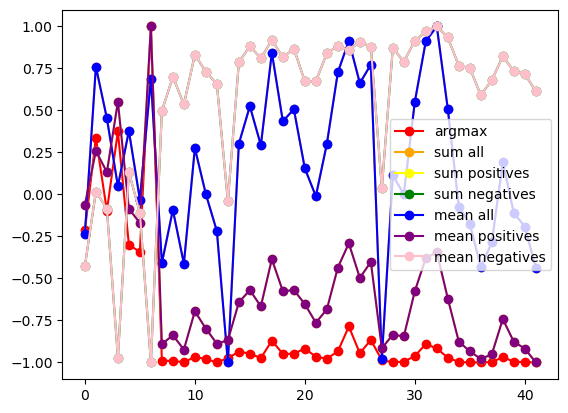

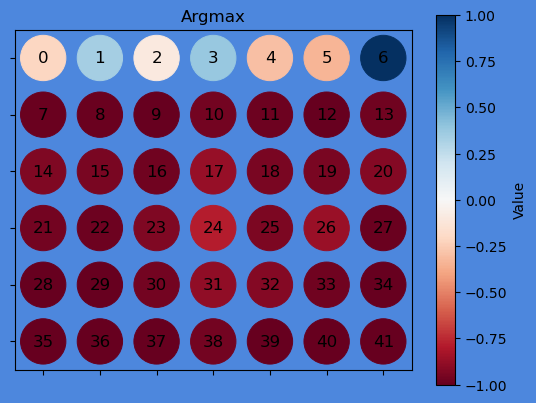

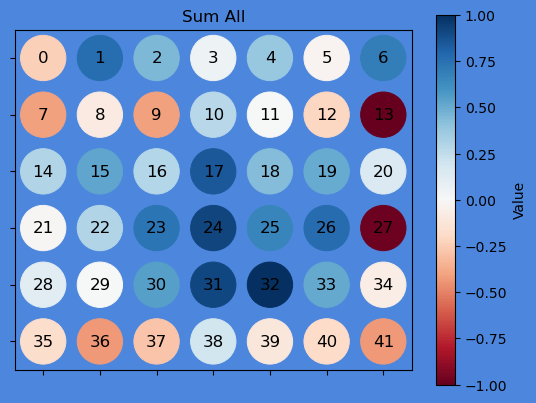

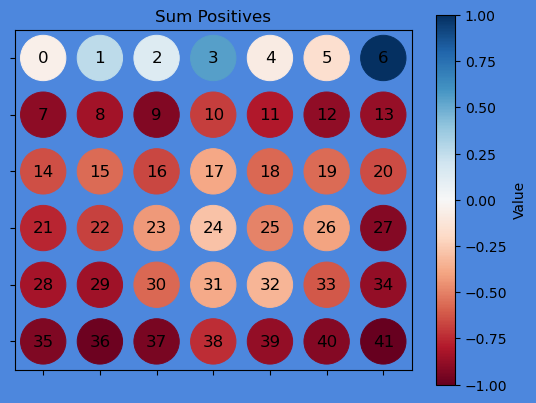

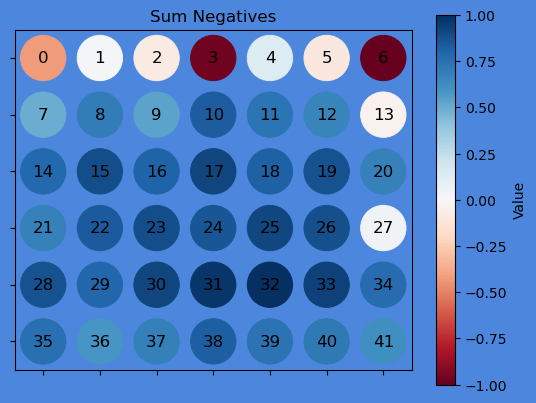

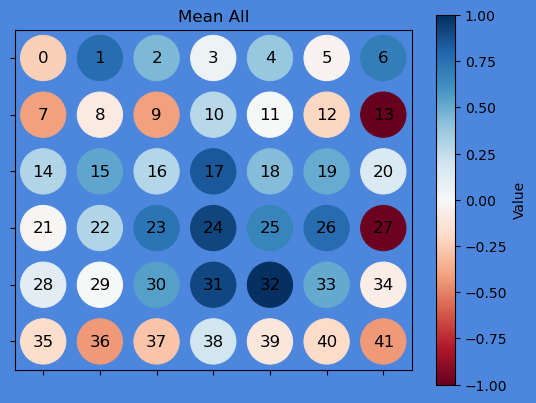

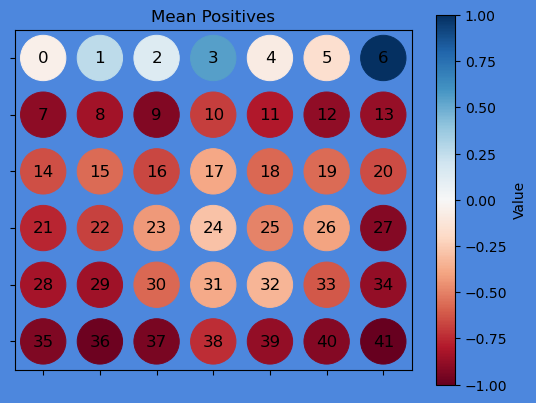

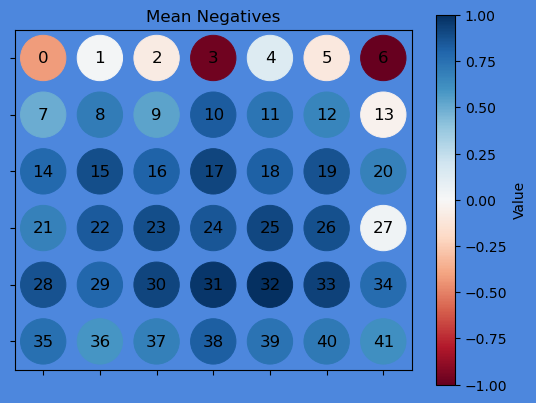

[[ 0.     0.     0.    ...  0.     0.     0.   ]
 [ 0.     0.     0.    ...  0.418  0.     0.   ]
 [ 0.     0.     0.    ...  0.216  0.     0.   ]
 ...
 [ 0.067  0.     0.068 ...  0.     0.021  0.015]
 [ 0.     0.    -0.    ...  0.     0.     0.   ]
 [ 0.012  0.     0.012 ...  0.     0.005  0.003]]
deep_taylor


C:\Users\jonas\AppData\Local\Temp\ipykernel_9684\1827416936.py:16: RuntimeWarning: invalid value encountered in divide
  vic4 = 2 * (vic4 - vic4.min()) / (vic4.max() - vic4.min()) - 1
C:\Users\jonas\AppData\Local\Temp\ipykernel_9684\1827416936.py:19: RuntimeWarning: invalid value encountered in divide
  vic7 = 2 * (vic7 - vic7.min()) / (vic7.max() - vic7.min()) - 1


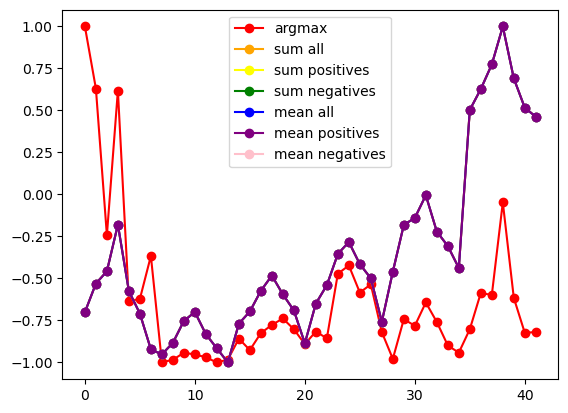

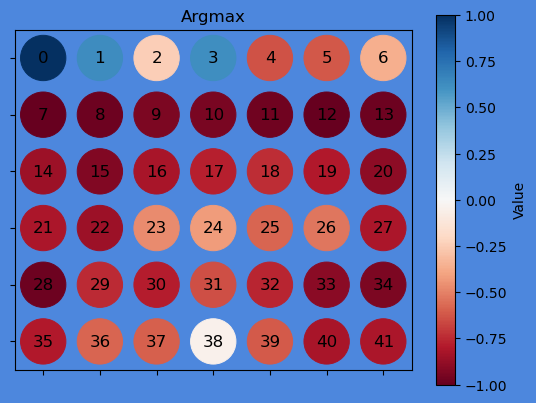

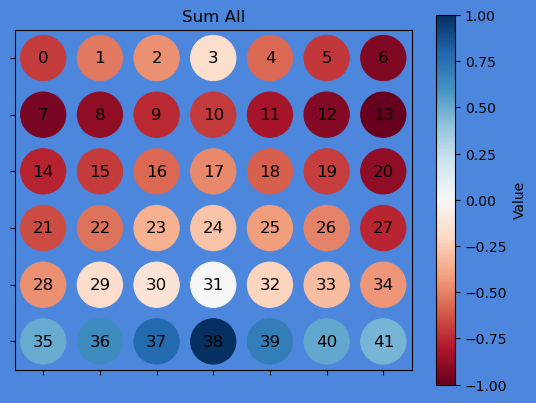

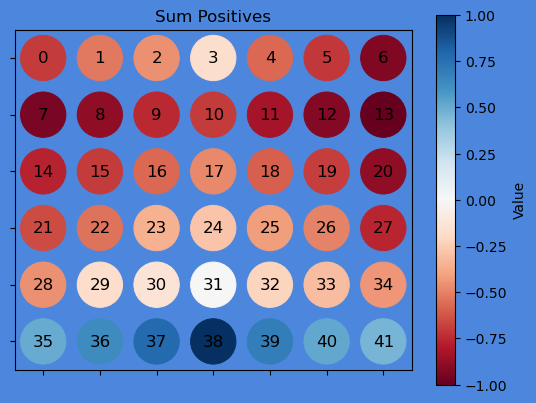

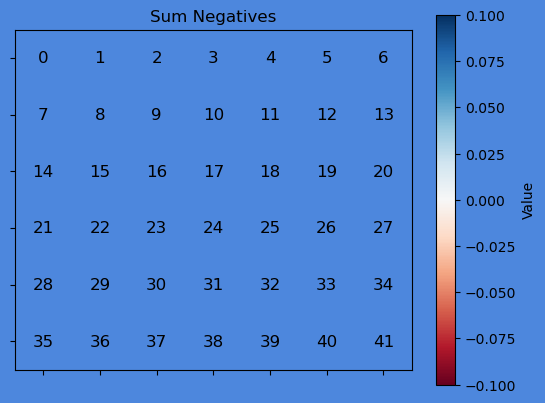

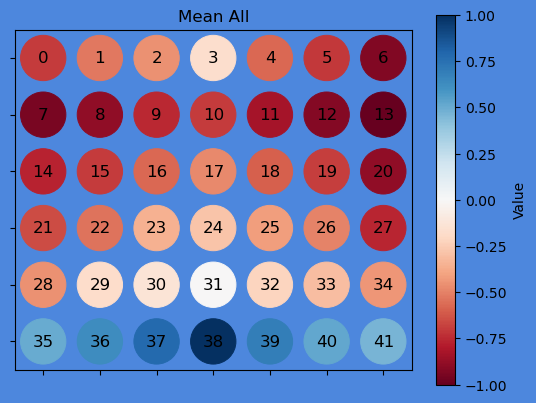

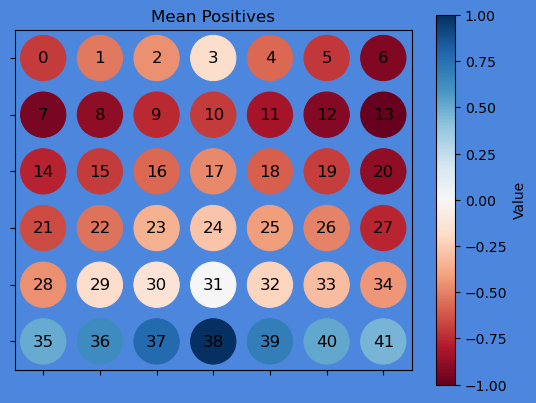

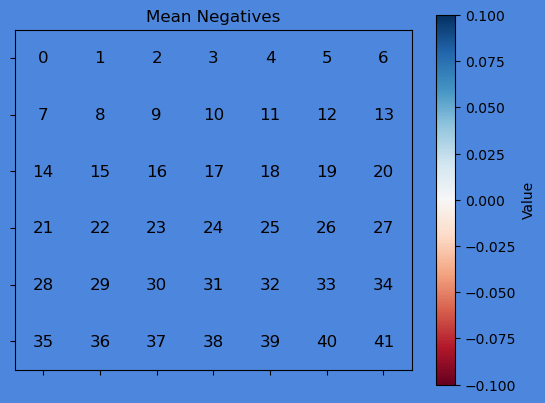

In [68]:
# model.compile(optimizer=optimizer, loss=loss_fn)

# Stripping the softmax activation from the model
#model_wo_sm = innvestigate.model_wo_softmax(model)

# Creating an analyzer
# Using LRP 0 instead of gradient
# equivalent to the inputs
possible_analyzer_types = ['input', 'random', 'gradient', 'input_t_gradient', 'deconvnet', 
                           'guided_backprop', 'integrated_gradients', 'smoothgrad', 'deep_taylor']

for analyzer_type in possible_analyzer_types:
    gradient_analyzer = innvestigate.create_analyzer(analyzer_type, model)

    # Applying the analyzer
    analysis = gradient_analyzer.analyze(X)
    print(analysis)

    print(analyzer_type)
    
    vic1, vic2, vic3, vic4, vic5, vic6, vic7 = plot_graphs(analysis)
    
    visualize_cell_importance(vic1, title='Argmax', name=date+'_innvestigate_'+analyzer_type+'_'+file_name+'_argmax')
    visualize_cell_importance(vic2, title='Sum All', name=date+'_innvestigate_'+analyzer_type+'_'+file_name+'_sum_all')
    visualize_cell_importance(vic3, title='Sum Positives', name=date+'_innvestigate_'+analyzer_type+'_'+file_name+'_sum_pos')
    visualize_cell_importance(vic4, title='Sum Negatives', name=date+'_innvestigate_'+analyzer_type+'_'+file_name+'_sum_neg')
    visualize_cell_importance(vic5, title='Mean All', name=date+'_innvestigate_'+analyzer_type+'_'+file_name+'_mean_all')
    visualize_cell_importance(vic6, title='Mean Positives', name=date+'_innvestigate_'+analyzer_type+'_'+file_name+'_mean_pos')
    visualize_cell_importance(vic7, title='Mean Negatives', name=date+'_innvestigate_'+analyzer_type+'_'+file_name+'_mean_neg')

# Displaying the gradient
# plt.imshow(analysis)#, cmap="seismic", interpolation="nearest")
# plt.show()

In [24]:
# model.save('reasonable_strategy_model_dataset_2_seed_5')

INFO:tensorflow:Assets written to: reasonable_strategy_model_dataset_2_seed_5\assets


In [21]:
# model = tf.keras.models.load_model('my_model')

# # Show the model architecture
# model.summary()

Model: "q_network_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             multiple                  5504      
                                                                 
 dense_4 (Dense)             multiple                  8256      
                                                                 
 dense_5 (Dense)             multiple                  455       
                                                                 
Total params: 14,215
Trainable params: 14,215
Non-trainable params: 0
_________________________________________________________________


### Questions and Ideas during the process
- miniMax score of all possible moves for the board
- miniMax score of the possible best move for the board
- miniMax score of all possible moves averaged
- the section scoring function used inside the miniMax function (assigning points to every winning line section)  
- a score for each possible move (THIS)

Scoring Questions
- What happens when I want to score a board which I just played on? Using miniMax it would be like doing 2 consecutive moves and scoring based on that
- Should I score only after the enemy has played/before I have played?

(Maybe) Extra Variable, whose turn it is  
Add noise to winning & losing moves, to stop the model from going for the left most columns first  
Before Training as a transformation flip the dataset vertically as well as the scores

Opposite of the miniMax is the score for the other player  
Having the miniMax player sometimes use randomly to not have the same board everytime  
Discuss the difficutly of generating different datasets and processing time etc limitations  
Generate board by using minimax and random move randomly distributed between both players  
Use numba to translate into c to speed up the mininmax function  
Limit to 1 hour for dataset creation  
Different amount of random when using minimax    

Small bias in input towards the winner since that player is represented one more times  
Small bias towards player 1 since the player who starts has a slightly higher win rate  

Show the neurons weight maps (analyse and get insights if its not totaly random),  
and the gradient using different apporaches of explainability  
Describing the XAI methods i use, what do the weights represent in the analyzer? (input , gradient, etc.)  


Describe the reproducibility of the analysis in different settings

Dataset Sums that are possible with players 1 and 2:  
1 3 4 6 7 9 10 12 13 15 16 18 19 21 22 24 25 27 28 30 31 33 34 36 37 39 40  
Dataset Sums that are possible with players 1 and -1:  
1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1

- Add accuracy scores again (multiple moves can be good)  
    - If I dont use normalization I can say every score above +1000 is a winning move and should count it as a correct move
    - The models accuracy might increase since the little differentiations between the column scores are too subtle
- Are the problems in the logic of the game, limited data or training the model  
    - Loss is pretty small and accuracy has only been tested on THE best move (predictions vs targets) and is about ~40-50%
    - Considering multiple moves can be winning plays the scores indicate no real problems (further testing with accuracy required though)
- Trying different models  
    - A lot of different 
- Trying different amount of datapoints to see the learning curve
- Random vs Random Dataset training
- Different XAI Methods, (Innvestigate(LRP), Captum(Integrated Gradient)), Consistency
- Heatmap for the most important place to put the chip, Heatmap for the most important place to look at for placing the chip

- Revamped Accuracy
- Less Datapoints for learning curve
- Starting to write
    - Introduction
    - Background (Discussing underlying techniques, Related Work)
        - Related Work: Papers about the XAI-Methods
        - Autonomous agents
        - Approximating the Minimax
    - The Insights gathered are more important than applied research more for the methods
- Heatmap for the most important place to look at for placing the chip (maybe too difficult)